# **Capstone Project**

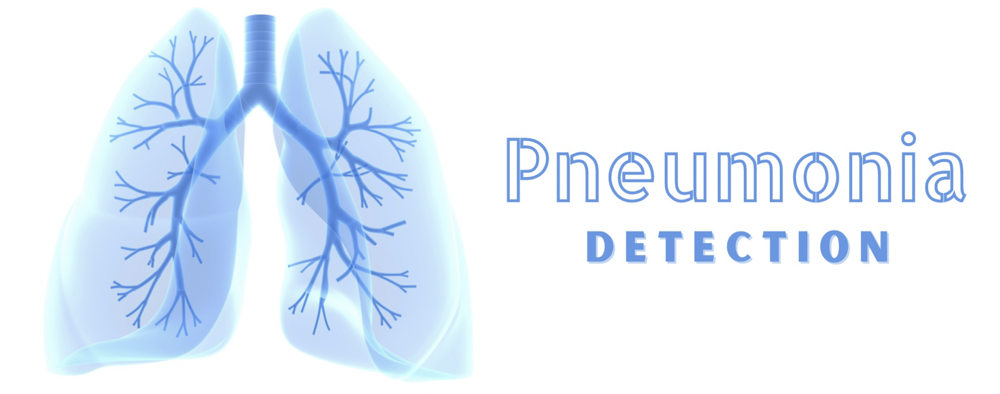

## Problem Statement

**Business Context:**
Pneumonia is one of the leading causes of morbidity and mortality worldwide, particularly affecting children under five years and elderly populations. According to the World Health Organization (WHO), pneumonia accounts for a significant percentage of deaths caused by infectious diseases. Early detection and timely treatment are critical to improving patient outcomes, yet current diagnostic methods present challenges.

The most common method for diagnosing pneumonia is through clinical evaluation combined with chest X-ray imaging. However, accurate interpretation of X-rays requires skilled radiologists, whose availability is limited in many regions, especially in rural or resource-constrained healthcare settings. Even when radiologists are available, factors such as fatigue, high patient load, and human error can affect the accuracy and consistency of diagnosis. This may lead to delayed treatment, misdiagnosis, or unnecessary use of antibiotics, worsening patient outcomes and straining healthcare systems.


With the advancement of machine learning and deep learning, automated image analysis has emerged as a promising solution to support medical imaging tasks. Leveraging large datasets of chest X-ray images, AI-driven approaches can be trained to recognize pneumonia-related abnormalities in the lungs with high accuracy and consistency. Such systems can serve as decision-support tools for healthcare professionals, reducing diagnostic workload, improving accuracy, and providing timely interventions, particularly in areas with limited medical expertise.


**Objective:**

The main objective of this project is to develop an intelligent, automated system capable of detecting pneumonia from chest X-ray images using machine learning and deep learning techniques. The system should aim to:

* Accurately classify chest X-ray images into pneumonia-positive and pneumonia-negative cases.

* Assist healthcare professionals by providing a reliable second opinion that reduces diagnostic errors and variability.

* Improve efficiency by delivering faster diagnoses, enabling timely treatment, and reducing the burden on radiologists.

* Enhance accessibility by offering a scalable solution that can be deployed in hospitals, clinics, or rural healthcare centers with limited resources.

* Support global health efforts by contributing to early detection, lowering pneumonia-related mortality rates, and optimizing antibiotic usage.


Ultimately, the solution aims to bridge the gap between limited medical expertise and growing healthcare demands, making pneumonia diagnosis more accurate, efficient, and accessible worldwide.


**Data Description:**

In the dataset, some of the features are labeled “Not Normal No Lung Opacity”. This extra third class indicates that while pneumonia was determined not to be present, there was nonetheless some type of abnormality on the image and oftentimes this finding may mimic the appearance of true pneumonia. Dicom original images: - Medical images are stored in a special format called DICOM files (*.dcm). They contain a combination of header metadata as well as underlying raw image arrays for pixel data

# **A. Import and Load**

## **A.1: Install and Import Functions**

In [1]:
pip install pydicom huggingface_hub

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 54.1 MB/s eta 0:00:00


In [2]:
# ============================================================
# Basic Libraries
# ============================================================
import os
import io
import math
import zipfile
import warnings
from tqdm import tqdm
from concurrent.futures import ThreadPoolExecutor, as_completed

warnings.filterwarnings("ignore")


# ============================================================
# Data Handling
# ============================================================
import numpy as np
import pandas as pd


# ============================================================
# Image Processing
# ============================================================
import cv2
import pydicom
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap
from google.colab.patches import cv2_imshow


# ============================================================
# Google Drive
# ============================================================
from google.colab import drive


# ============================================================
# Scikit-learn
# ============================================================
from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import (
    accuracy_score,
    recall_score,
    precision_score,
    f1_score,
    roc_auc_score,
    average_precision_score,
    classification_report,
    confusion_matrix,
    precision_recall_curve,
)


# ============================================================
# TensorFlow / Keras
# ============================================================
import tensorflow as tf
import keras

from tensorflow.keras import regularizers, mixed_precision
from tensorflow.keras.utils import Sequence
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import (
    Conv2D,
    MaxPooling2D,
    Dense,
    Dropout,
    BatchNormalization,
    GlobalAveragePooling2D,
)
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.applications.vgg16 import VGG16

from matplotlib.colors import LinearSegmentedColormap
medical_green = LinearSegmentedColormap.from_list("med_green", ["black", "#00ff41"])

## **A.2: Load Data**

In [3]:
### Mount Google drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [4]:
### Set path to the files given

google_path = '/content/drive/My Drive/Colab Notebooks/capstone_project/pnemonia'

zip_path_train = f"{google_path}/stage_2_train_images.zip"

zip_path_test = f"{google_path}/stage_2_test_images.zip"

In [5]:
### Module to convert the zip images into raw npy images for faster execution
def cache_raw_dicom_zip_to_npy(zip_path, dicom_folder_name, output_cache_dir):
    """
    Reads DICOM files from ZIP and saves raw pixel_array as .npy.
    No resizing, no normalization, no channel expansion.
    Skips files already present in cache.
    """

    os.makedirs(output_cache_dir, exist_ok=True)

    with zipfile.ZipFile(zip_path, "r") as z:
        members = [
            m for m in z.namelist()
            if m.startswith(dicom_folder_name + "/") and m.endswith(".dcm")
        ]

        print(f"Total DICOM files found: {len(members)}")

        skipped = 0
        created = 0
        failed = 0

        for m in tqdm(members):
            patient_id = os.path.basename(m).replace(".dcm", "")
            cache_path = os.path.join(output_cache_dir, f"{patient_id}.npy")

            if os.path.exists(cache_path):
                skipped += 1
                continue

            try:
                with z.open(m) as f:
                    ds = pydicom.dcmread(io.BytesIO(f.read()))

                img = ds.pixel_array.astype(np.float32)

                np.save(cache_path, img)

                created += 1

            except Exception as e:
                failed += 1
                print(f"Failed: {patient_id} | {e}")

    print("Caching completed.")
    print("Created:", created)
    print("Skipped:", skipped)
    print("Failed:", failed)

In [6]:
### Converting train zip images to raw npy images
raw_cache_train_dir = f"{google_path}/raw_cache_train_npy"

cache_raw_dicom_zip_to_npy(
    zip_path=zip_path_train,
    dicom_folder_name="stage_2_train_images",
    output_cache_dir=raw_cache_train_dir
)

Total DICOM files found: 26684


100%|██████████| 26684/26684 [01:40<00:00, 266.67it/s] 

Caching completed.
Created: 0
Skipped: 26684
Failed: 0


In [7]:
### Converting test zip images to raw npy images

raw_cache_test_dir = f"{google_path}/raw_cache_test_npy"

cache_raw_dicom_zip_to_npy(
    zip_path=zip_path_test,
    dicom_folder_name="stage_2_test_images",
    output_cache_dir=raw_cache_test_dir
)

Total DICOM files found: 3000


100%|██████████| 3000/3000 [00:00<00:00, 4944.52it/s]

Caching completed.
Created: 0
Skipped: 3000
Failed: 0


In [8]:
### Reading class info file given
df = pd.read_csv(f"{google_path}/stage_2_detailed_class_info.csv")

In [9]:
df.head()

,patientId,class
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,No Lung Opacity / Not Normal
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,No Lung Opacity / Not Normal
2,00322d4d-1c29-4943-afc9-b6754be640eb,No Lung Opacity / Not Normal
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,Normal
4,00436515-870c-4b36-a041-de91049b9ab4,Lung Opacity


In [10]:
### Loading training data given
df_train = pd.read_csv(f"{google_path}/stage_2_train_labels.csv")

In [11]:
df_train

,patientId,width,height,Target
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,NaN,NaN,0
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,NaN,NaN,0
2,00322d4d-1c29-4943-afc9-b6754be640eb,NaN,NaN,0
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,NaN,NaN,0
4,00436515-870c-4b36-a041-de91049b9ab4,213.0,379.0,1
...,...,...,...,...
30222,c1ec14ff-f6d7-4b38-b0cb-fe07041cbdc8,228.0,379.0,1
30223,c1edf42b-5958-47ff-a1e7-4f23d99583ba,NaN,NaN,0
30224,c1f6b555-2eb1-4231-98f6-50a963976431,NaN,NaN,0
30225,c1f7889a-9ea9-4acb-b64c-b737c929599a,261.0,345.0,1


In [12]:
### Creating test csv from the image file given
def create_test_df_from_zip(zip_test_path):
    with zipfile.ZipFile(zip_test_path, 'r') as z:
        file_list = z.namelist()

    patient_ids = [
        os.path.basename(f).replace('.dcm', '')
        for f in file_list
        if f.startswith('stage_2_test_images/') and f.endswith('.dcm')
    ]

    df_test = pd.DataFrame({'patientId': patient_ids})

    return df_test

df_test = create_test_df_from_zip(zip_path_test)
print(df_test.head())
print("Total test images:", len(df_test))

                              patientId
0  2392af63-9496-4e72-b348-9276432fd797
1  2ce40417-1531-4101-be24-e85416c812cc
2  2bc0fd91-931a-446f-becb-7a6d3f2a7678
3  29d42f45-5046-4112-87fa-18ea6ea97e75
4  208e3daf-18cb-4bf7-8325-0acf318ed62c
Total test images: 3000


## **A.3: Observations:**

* Loaded the zip files and Successfully built a pipeline: DICOM → raw .npy
* Loaded all the csv label data for both class file and df_train
* Created df_test file from the image zip file that was given
* Dataset consists of chest X-ray images in DICOM format
* Each image is mapped to a unique patientId
* Labels indicate presence (1) or absence (0) of lung opacity (pneumonia proxy)
* Data is large-scale (~30k images), requiring efficient handling

# **B. Exploratory Data Analysis**

## **B.1: EDA on data file**

In [13]:
df.groupby('class')['patientId'].nunique()

,patientId
class,
Lung Opacity,6012
No Lung Opacity / Not Normal,11821
Normal,8851


In [14]:
df_train.groupby('Target')['patientId'].nunique()

,patientId
Target,
0,20672
1,6012


In [15]:
df = pd.merge(df,df_train[['patientId','Target']],on='patientId',how='left')

In [16]:
df['Target'].fillna('NA',inplace=True)

In [17]:
df.groupby(['class','Target'])['patientId'].nunique()

,,patientId
class,Target,
Lung Opacity,1,6012
No Lung Opacity / Not Normal,0,11821
Normal,0,8851


In [18]:
p1 = df.patientId.nunique()
p2 = df_train.patientId.nunique()
print(f"#Patient IDs in class file is {p1} and #Patient ID in train file is {p2}")

#Patient IDs in class file is 26684 and #Patient ID in train file is 26684


In [19]:
print(df_train['Target'].value_counts(normalize=True) * 100)

Target
0    68.389188
1    31.610812
Name: proportion, dtype: float64


In [20]:
# Convert to sets
train_ids = set(df["patientId"])
test_ids = set(df_test["patientId"])

# Find overlap
overlap = train_ids.intersection(test_ids)

print("Number of overlapping IDs:", len(overlap))

Number of overlapping IDs: 0


In [21]:
# Convert to sets
train_ids = set(df_train["patientId"])
test_ids = set(df_test["patientId"])

# Find overlap
overlap = train_ids.intersection(test_ids)

print("Number of overlapping IDs:", len(overlap))

Number of overlapping IDs: 0


## **B.2: Observations:**

## **B.3: X-rays: Visual representation**

#### Funtion to print the image

In [22]:
from matplotlib.colors import LinearSegmentedColormap
medical_green = LinearSegmentedColormap.from_list("med_green", ["black", "#00ff41"])

In [23]:
def print_dicom_from_cache(cache_dir, label_data, target_column="Target", num_to_show=16):
    total_images = len(label_data)
    random_indices = np.random.choice(total_images, size=num_to_show, replace=False)

    fig, axes = plt.subplots(4, 4, figsize=(15, 12))
    axes = axes.flatten()

    for i, idx in enumerate(random_indices):
        ax = axes[i]

        patient_id = str(label_data["patientId"].iloc[idx])
        label = label_data[target_column].iloc[idx]
        cache_path = os.path.join(cache_dir, f"{patient_id}.npy")

        try:
            img = np.load(cache_path, allow_pickle=False)

            # Fix shape if image has extra dimension
            img = np.squeeze(img)

            if img.ndim != 2:
                raise ValueError(f"Invalid image shape: {img.shape}")

            ax.imshow(img, cmap=medical_green)
            ax.set_title(f"{patient_id}\nLabel: {label}")

        except FileNotFoundError:
            ax.set_title(f"Missing:\n{patient_id}")

        except Exception as e:
            ax.set_title(f"Error:\n{patient_id}\n{str(e)[:30]}")

        ax.axis("off")

    plt.tight_layout()
    plt.show()

#### Print all the images without Pnemonia Flag

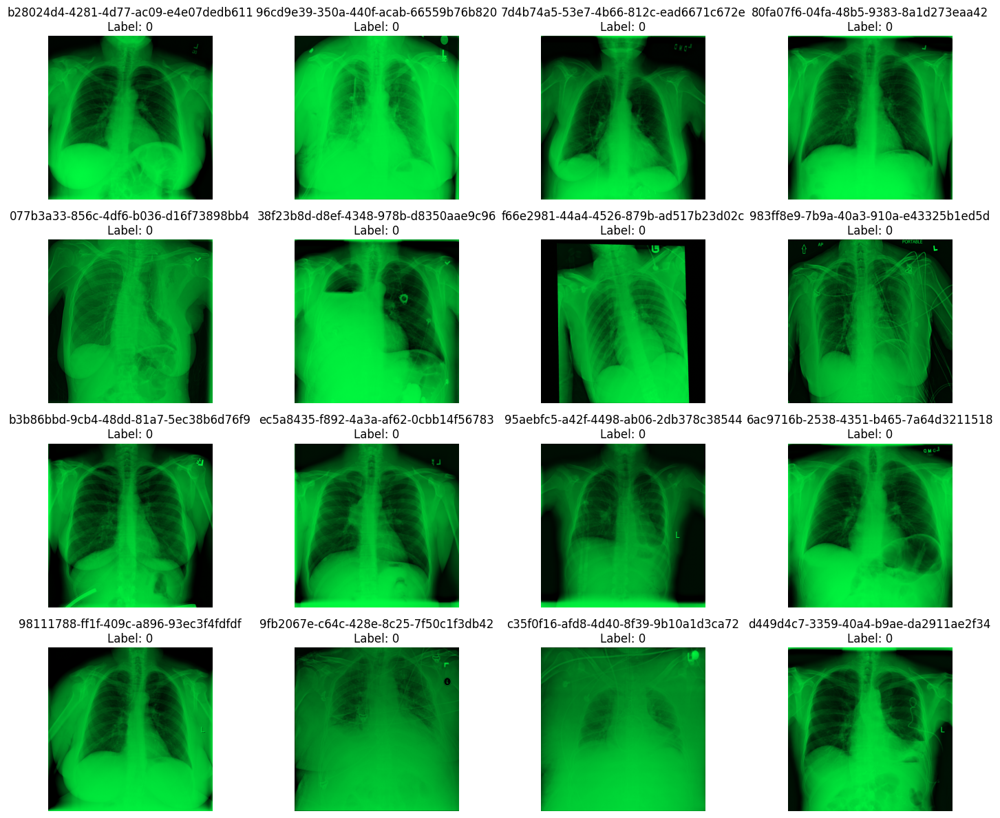

In [24]:
print_dicom_from_cache(
    cache_dir=raw_cache_train_dir,
    label_data=df_train[df_train['Target']==0],
    target_column="Target",
    num_to_show=16
)

#### Print all the images with Pnemonia

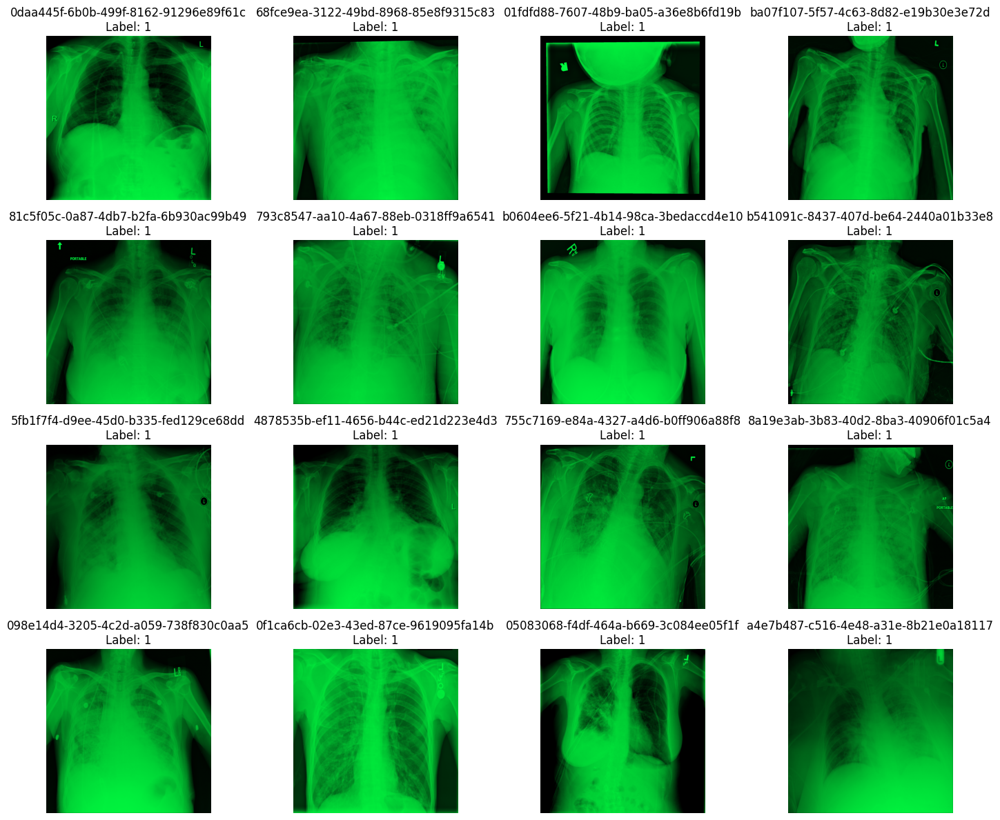

In [25]:
print_dicom_from_cache(
    cache_dir=raw_cache_train_dir,
    label_data=df_train[df_train['Target']==1],
    target_column="Target",
    num_to_show=16
)

#### Print all the images with normal flag

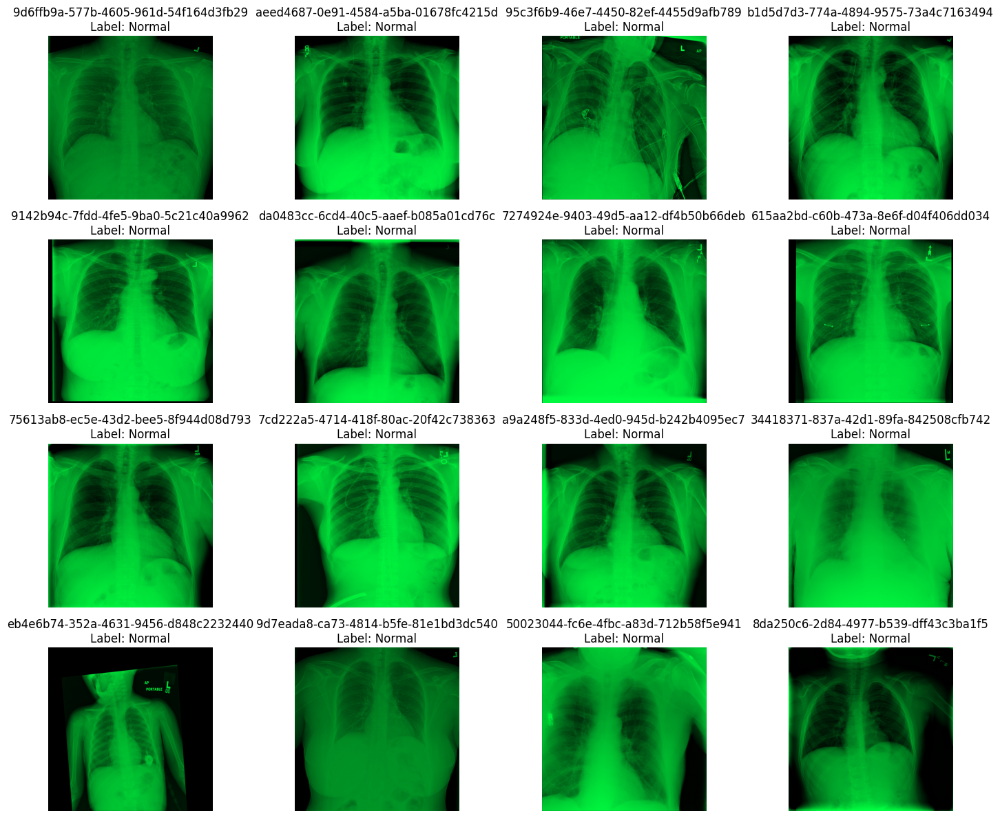

In [26]:
print_dicom_from_cache(
    cache_dir=raw_cache_train_dir,
    label_data=df[df['class']=='Normal'],
    target_column="class",
    num_to_show=16
)

#### Print all the images with not normal flag

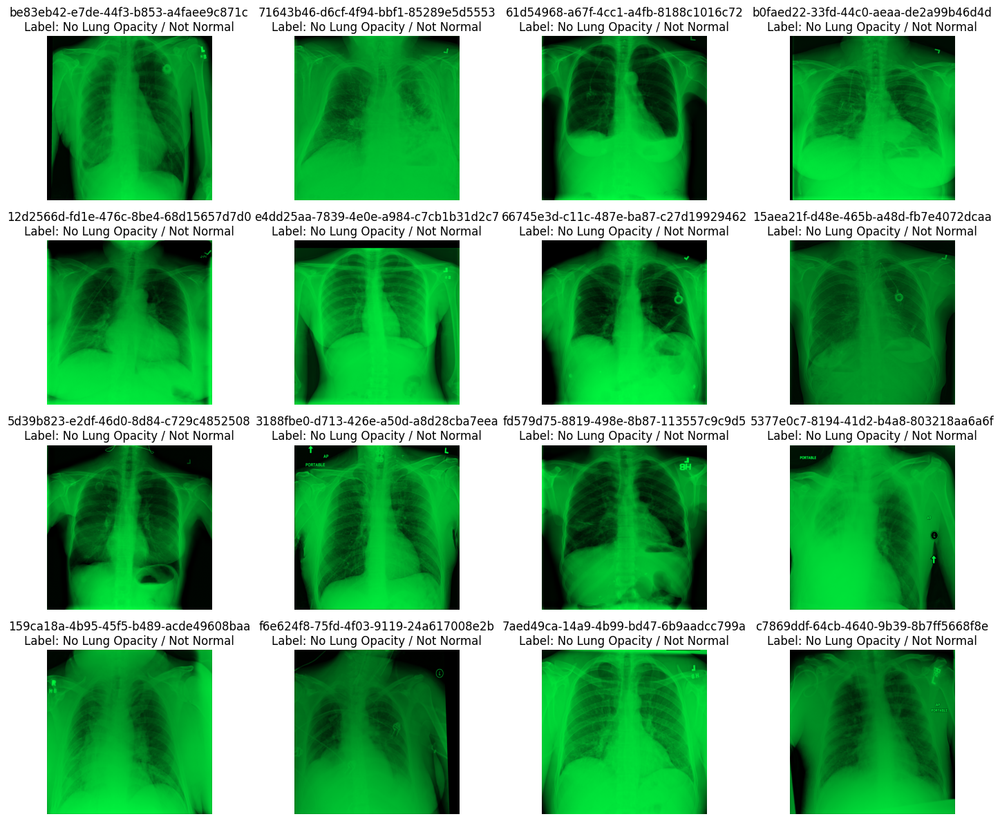

In [27]:
print_dicom_from_cache(
    cache_dir=raw_cache_train_dir,
    label_data=df[df['class']=='No Lung Opacity / Not Normal'],
    target_column="class",
    num_to_show=16
)

## **B.4: Observations:**

* Class imbalance observed:
    - Class 0 (No Lung Opacity) ≈ 65–70%
    - Class 1 (Lung Opacity) ≈ 30–35%

* Indicates moderate imbalance (not extreme, but impactful)

* Implication:
    - Accuracy alone is misleading
    - PR-AUC and Recall are more relevant metrics

* Images are grayscale medical X-rays

* Pixel intensity varies significantly across images

* Original resolutions vary (not uniform)

* Observations:
    - Some images are darker / low contrast
    - Some contain artifacts (text overlays, markers, borders)
    - Lung regions are central; background noise exists

* Differences in:
    - Exposure levels
    - Contrast
    - Noise
    - Orientation

* Indicates:
    - Data comes from multiple machines / environments
    - Model must generalize across variations

* Binary labeling:
    - 1 = Lung opacity (possible pneumonia)
    - 0 = Normal OR abnormal but not opacity

* Important nuance:
    - Class 0 includes both normal and other abnormalities
    - Model is detecting "opacity", not full diagnosis

* Pneumonia (opacity) appears as:
    - White / hazy regions in lungs
    - Often diffused, not sharply bounded

* Observations:
    - Patterns are relatively large-scale (not tiny features)
    - Supports resizing images without major information loss

* No overlap between train and test sets
* Ensures:
    - No data leakage
    - Reliable evaluation

* Exact overlap between class file and train file



**EDA reveals necessity of:**

* Resizing → standard input size

* Normalization → consistent pixel range

* Optional contrast enhancement (CLAHE)

* Removal of irrelevant borders/artifacts

# **C. Data Preprocessing - IMG SIZE 256**

## **C.1: Converting images to grayscale**

In [ ]:
IMG_SIZE = (256, 256)
BATCH_SIZE = 64
EPOCH = 20

**Grayscale Conversion Note**
- The input images are DICOM chest X-ray images and are already single-channel grayscale medical images.
- Therefore, explicit RGB to grayscale conversion was not required.
- The model input was standardized as `(height, width, 1)` by adding a channel dimension after preprocessing.

In [ ]:
def process_one_image(pid, raw_cache_dir, processed_cache_dir, img_size=IMG_SIZE):
    out_path = os.path.join(processed_cache_dir, f"{pid}.npy")

    if os.path.exists(out_path):
        return "skipped"

    raw_path = os.path.join(raw_cache_dir, f"{pid}.npy")

    try:
        img = np.load(raw_path).astype(np.float32)

        img = cv2.resize(img, img_size)
        img = cv2.normalize(img, None, 0, 1, cv2.NORM_MINMAX)
        img = np.expand_dims(img, axis=-1)

        np.save(out_path, img.astype(np.float32))
        return "created"

    except Exception as e:
        return f"failed: {pid} | {e}"


def create_processed_cache_parallel(
    patient_ids,
    raw_cache_dir,
    processed_cache_dir,
    img_size=IMG_SIZE,
    max_workers=8
):
    os.makedirs(processed_cache_dir, exist_ok=True)

    created = 0
    skipped = 0
    failed = []

    with ThreadPoolExecutor(max_workers=max_workers) as executor:
        futures = [
            executor.submit(
                process_one_image,
                pid,
                raw_cache_dir,
                processed_cache_dir,
                img_size
            )
            for pid in patient_ids
        ]

        for future in tqdm(as_completed(futures), total=len(futures)):
            result = future.result()

            if result == "created":
                created += 1
            elif result == "skipped":
                skipped += 1
            else:
                failed.append(result)

    print("Processed cache completed.")
    print("Created:", created)
    print("Skipped:", skipped)
    print("Failed:", len(failed))

    if failed:
        print("Sample failures:")
        for f in failed[:10]:
            print(f)

In [ ]:
processed_cache_train_dir = f"{google_path}/processed_cache_train_{IMG_SIZE[0]}"
#processed_cache_train_dir = f"/content/processed_cache_train_{IMG_SIZE[0]}"


create_processed_cache_parallel(
    patient_ids=df_train["patientId"].unique(),
    raw_cache_dir=raw_cache_train_dir,
    processed_cache_dir=processed_cache_train_dir,
    img_size=IMG_SIZE,
    max_workers=4
)

100%|██████████| 26684/26684 [00:00<00:00, 33846.27it/s]


Processed cache completed.
Created: 0
Skipped: 26684
Failed: 0


In [ ]:
def view_processed_cache_images(
    cache_dir,
    label_data,
    target_column="Target",
    num_to_show=16
):
    random_indices = np.random.choice(len(label_data), size=num_to_show, replace=False)

    fig, axes = plt.subplots(4, 4, figsize=(15, 12))
    axes = axes.flatten()

    for i, idx in enumerate(random_indices):
        ax = axes[i]

        patient_id = str(label_data["patientId"].iloc[idx])
        label = label_data[target_column].iloc[idx]

        path = os.path.join(cache_dir, f"{patient_id}.npy")

        try:
            img = np.load(path)

            # processed cache already has shape (H, W, 1)
            img = np.squeeze(img)

            ax.imshow(img, cmap=medical_green)
            ax.set_title(f"{patient_id}\nTarget: {label}")

        except FileNotFoundError:
            ax.set_title(f"Missing:\n{patient_id}")

        except Exception as e:
            ax.set_title(f"Error:\n{patient_id}")

        ax.axis("off")

    plt.tight_layout()
    plt.show()

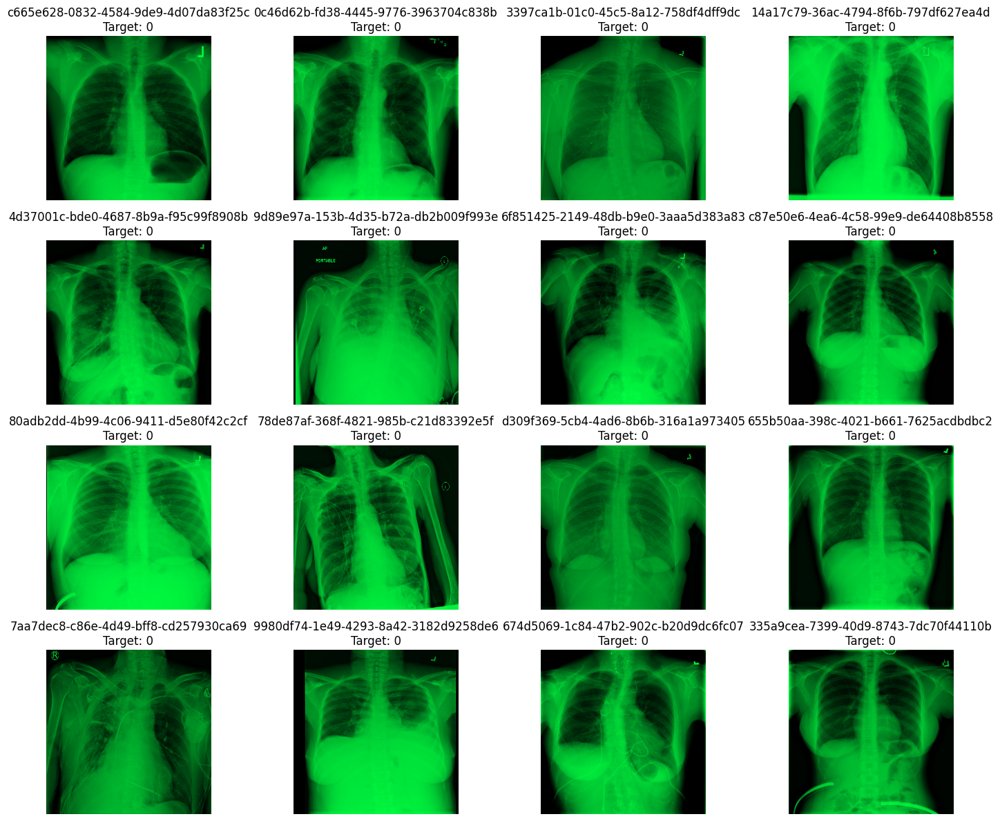

In [ ]:
view_processed_cache_images(
    cache_dir=processed_cache_train_dir,
    label_data=df_train[df_train['Target']==0],
    target_column="Target",
    num_to_show=16
)

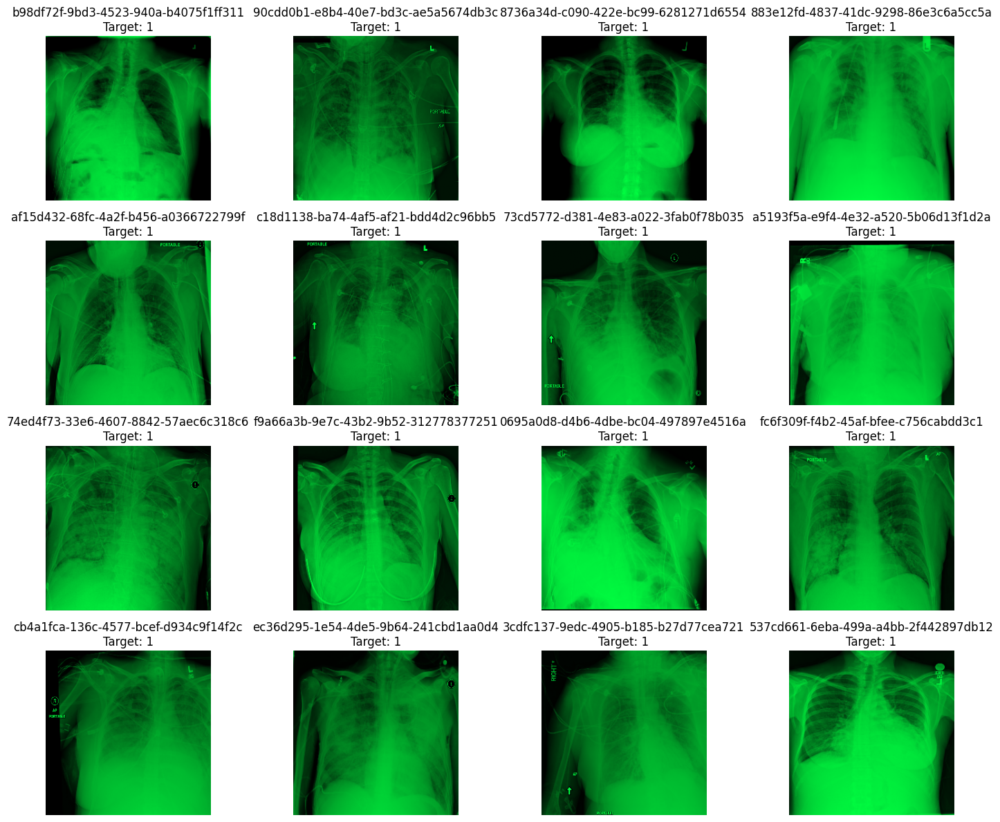

In [ ]:
view_processed_cache_images(
    cache_dir=processed_cache_train_dir,
    label_data=df_train[df_train['Target']==1],
    target_column="Target",
    num_to_show=16
)

## **C.2: Splitting the dataset**



In [ ]:
label_column_name = 'Target'

X = df_train[['patientId']]
y = df_train[label_column_name].astype(int)

# First split: 70% train, 30% temp (val+test)
X_train, X_val, y_train, y_val = train_test_split(
    X, y, test_size=0.3, random_state=42, stratify=y
)

print("--- Training Data ---")
print("Image shape:", X_train.shape)
print("Label shape:", y_train.shape)
print("\n--- Validation Data ---")
print("Image shape:", X_val.shape)
print("Label shape:", y_val.shape)

--- Training Data ---
Image shape: (21158, 1)
Label shape: (21158,)

--- Validation Data ---
Image shape: (9069, 1)
Label shape: (9069,)


**Train, Validation and Test Split Note**
- The labelled dataset was split into training and validation sets using stratified sampling.
- The test dataset was provided separately without labels and was used for final prediction/inference.
- Since test labels were not available, model performance was evaluated on the validation set, and predictions were generated for the test set.

## **C.3: Class weight**

In [ ]:
# make y_train 1D
y_train_flat = np.ravel(y_train).astype(int)

# check labels
print(np.unique(y_train_flat, return_counts=True))

# explicitly pass both binary classes
classes = np.array([0, 1])

weights = compute_class_weight(
    class_weight="balanced",
    classes=classes,
    y=y_train_flat
)

class_weights = dict(zip(classes, weights))
print(class_weights)

(array([0, 1]), array([14470,  6688]))
{np.int64(0): np.float64(0.7310988251554942), np.int64(1): np.float64(1.5817882775119618)}


In [ ]:
class_weights = {
    0: 1.0,
    1: 1.3
}

# **D. Model Building and evaluation - IMG SIZE 256**

## **D.1: Model Evaluation Criterion Functions**

In [28]:
def get_threshold(model, generator):
    y_probs = model.predict(generator).reshape(-1)
    y_true = generator.labels

    precision, recall, thresholds = precision_recall_curve(y_true, y_probs)

    f1 = 2 * precision[:-1] * recall[:-1] / (
        precision[:-1] + recall[:-1] + 1e-8
    )

    best_idx = np.argmax(f1)
    best_threshold = thresholds[best_idx]

    print("Best threshold:", best_threshold)
    print("Precision:", precision[best_idx])
    print("Recall:", recall[best_idx])
    print("F1:", f1[best_idx])

    return best_threshold


In [29]:
def model_performance_classification(model, generator, threshold=0.5):


    # Predictions
    y_pred_probs = model.predict(generator, verbose=1).reshape(-1)
    y_pred = (y_pred_probs > threshold).astype(int)

    # True labels
    y_true = generator.labels

    # Metrics
    acc = accuracy_score(y_true, y_pred)

    recall_1 = recall_score(y_true, y_pred, pos_label=1)
    precision_1 = precision_score(y_true, y_pred, pos_label=1)
    f1_1 = f1_score(y_true, y_pred, pos_label=1)

    # AUCs
    roc_auc = roc_auc_score(y_true, y_pred_probs)
    pr_auc = average_precision_score(y_true, y_pred_probs)

    # Confusion Matrix
    cm = confusion_matrix(y_true, y_pred)

    print("\nThreshold used:", threshold)
    print("\nConfusion Matrix:\n", cm)

    print("\nClassification Report:\n")
    print(classification_report(y_true, y_pred))

    df_perf = pd.DataFrame({
        "Accuracy": [acc],
        "Recall (Class 1)": [recall_1],
        "Precision (Class 1)": [precision_1],
        "F1 (Class 1)": [f1_1],
        "ROC-AUC": [roc_auc],
        "PR-AUC": [pr_auc]
    })

    return df_perf

In [30]:
def plot_confusion_matrix(model, generator, threshold=0.5):
    """
    Modified to handle Keras Sequence Generators for DICOM data
    """

    # 1. Get all true labels from the generator
    y_true = generator.labels

    # 2. Get predictions for the entire generator
    # Setting shuffle=False is critical to keep labels and predictions aligned
    y_pred_probs = model.predict(generator, verbose=1)
    y_pred = (y_pred_probs.reshape(-1) > threshold).astype(int)

    # 3. Compute Confusion Matrix
    cm = tf.math.confusion_matrix(y_true, y_pred)

    # 4. Plotting
    plt.figure(figsize=(10, 8))
    sns.heatmap(
        cm,
        annot=True,
        linewidths=.4,
        fmt="d",
        square=True,
        cmap=medical_green
    )
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title('Confusion Matrix')
    plt.show()

In [31]:
def visual_check_from_cache(
    cache_dir,
    X_data,
    y_data,
    model,
    threshold=0.5,
    num_to_show=16
):
    total_images = len(X_data)
    random_indices = np.random.choice(total_images, size=num_to_show, replace=False)

    cols = 5
    rows = math.ceil(num_to_show / cols)

    fig, axes = plt.subplots(rows, cols, figsize=(15, 4 * rows), facecolor="black")
    axes = axes.flatten()

    for i, idx in enumerate(random_indices):
        ax = axes[i]

        patient_id = str(X_data["patientId"].iloc[idx])

        if hasattr(y_data, "iloc"):
            true_label = int(y_data.iloc[idx])
        else:
            true_label = int(y_data[idx])

        cache_path = os.path.join(cache_dir, f"{patient_id}.npy")

        try:
            img = np.load(cache_path).astype(np.float32)

            # expected processed shape: (256, 256, 1)
            img_for_model = np.expand_dims(img, axis=0)

            prediction_prob = model.predict(img_for_model, verbose=0)[0][0]
            pred_label = 1 if prediction_prob > threshold else 0

            img_display = np.squeeze(img)

            ax.imshow(img_display, cmap=medical_green)

            title_color = "lime" if pred_label == true_label else "red"
            ax.set_title(
                f"ID: {patient_id}\nActual: {true_label} | Pred: {pred_label}\nProb: {prediction_prob:.3f}",
                color=title_color,
                fontsize=9
            )

        except FileNotFoundError:
            ax.set_title(f"Missing cache:\n{patient_id}", color="yellow")

        except Exception as e:
            ax.set_title(f"Error:\n{patient_id}\n{str(e)[:30]}", color="yellow")

        ax.axis("off")

    for j in range(i + 1, len(axes)):
        axes[j].axis("off")

    plt.tight_layout()
    plt.show()

## **D.2: Model 1: Simple Convolutional Neural Network (CNN)**

In [ ]:
X_train.shape

(21158, 1)

In [ ]:
class ProcessedNpyDataGenerator(Sequence):
    def __init__(self, patient_ids, labels, cache_dir, batch_size=BATCH_SIZE, shuffle=True):
        self.patient_ids = np.array(patient_ids)
        self.labels = np.array(labels).astype(int)
        self.cache_dir = cache_dir
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.indices = np.arange(len(self.patient_ids))
        self.on_epoch_end()

    def __len__(self):
        return int(np.ceil(len(self.patient_ids) / self.batch_size))

    def __getitem__(self, idx):
        batch_indices = self.indices[idx*self.batch_size:(idx+1)*self.batch_size]

        images, labels = [], []

        for i in batch_indices:
            pid = self.patient_ids[i]
            img = np.load(os.path.join(self.cache_dir, f"{pid}.npy"))

            images.append(img)
            labels.append(self.labels[i])

        return np.array(images, dtype=np.float32), np.array(labels)

    def on_epoch_end(self):
        if self.shuffle:
            np.random.shuffle(self.indices)

In [ ]:
mixed_precision.set_global_policy("mixed_float16")

In [ ]:
img_size = IMG_SIZE

cnn_model_1 = Sequential([
    Conv2D(32, (3,3), activation='relu', padding='same',
           input_shape=(IMG_SIZE[0],IMG_SIZE[1],1)),
    MaxPooling2D(2,2),

    Conv2D(64, (3,3), activation='relu', padding='same'),
    MaxPooling2D(2,2),

    Conv2D(128, (3,3), activation='relu', padding='same'),
    MaxPooling2D(2,2),

    GlobalAveragePooling2D(),

    Dense(64, activation='relu'),
    Dropout(0.3),

    Dense(1, activation='sigmoid', dtype='float32')
])

cnn_model_1.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss='binary_crossentropy',
    metrics=[
        'accuracy',
        tf.keras.metrics.AUC(name='roc_auc'),
        tf.keras.metrics.AUC(name='pr_auc', curve='PR'),
        tf.keras.metrics.Recall(name='recall'),
        tf.keras.metrics.Precision(name='precision')
    ]
)

In [ ]:
cnn_model_1.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 256, 256, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 128, 128, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 64, 64, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 100,993 (394.50 KB)

 Trainable params: 100,993 (394.50 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
X_train_temp = X_train.copy()
y_train_temp = y_train.copy()
X_val_temp = X_val.copy()
y_val_temp = y_val.copy()

In [ ]:
y_train_temp

,Target
30097,1
23456,0
14645,0
6482,1
6567,0
...,...
2537,0
477,0
6348,0
25346,0


In [ ]:
def get_generator(X, y, path, batch_size, shuffle):
    return ProcessedNpyDataGenerator(
        X["patientId"].values,
        y.values,
        path,
        batch_size=batch_size,
        shuffle=shuffle
    )

In [ ]:
train_gen = get_generator(X_train_temp, y_train_temp, processed_cache_train_dir, BATCH_SIZE, shuffle=True)
val_gen = get_generator(X_val_temp, y_val_temp, processed_cache_train_dir, BATCH_SIZE, shuffle=False)

train_eval_gen = get_generator(X_train_temp, y_train_temp, processed_cache_train_dir, BATCH_SIZE, shuffle=False)
val_eval_gen = get_generator(X_val_temp, y_val_temp, processed_cache_train_dir, BATCH_SIZE, shuffle=False)

## **D.3: Training the model**

In [ ]:
callbacks = [
    tf.keras.callbacks.EarlyStopping(
        monitor='val_pr_auc',
        mode='max',
        patience=4,
        restore_best_weights=True
    ),
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor='val_pr_auc',
        mode='max',
        factor=0.3,
        patience=2,
        min_lr=1e-7
    )
]

history_1 = cnn_model_1.fit(
    train_gen,
    validation_data=val_gen,
    epochs=20,
    callbacks=callbacks,
    class_weight=class_weights,
    verbose=2
)

Epoch 1/20
331/331 - 128s - 387ms/step - accuracy: 0.6810 - loss: 0.7235 - pr_auc: 0.3351 - precision: 0.2987 - recall: 0.0069 - roc_auc: 0.5389 - val_accuracy: 0.6843 - val_loss: 0.6285 - val_pr_auc: 0.4193 - val_precision: 0.8333 - val_recall: 0.0017 - val_roc_auc: 0.5962 - learning_rate: 1.0000e-04
Epoch 2/20
331/331 - 47s - 141ms/step - accuracy: 0.6865 - loss: 0.7045 - pr_auc: 0.4244 - precision: 0.5275 - recall: 0.0803 - roc_auc: 0.6198 - val_accuracy: 0.6929 - val_loss: 0.5972 - val_pr_auc: 0.4729 - val_precision: 0.5568 - val_recall: 0.1402 - val_roc_auc: 0.6613 - learning_rate: 1.0000e-04
Epoch 3/20
331/331 - 56s - 169ms/step - accuracy: 0.6902 - loss: 0.6797 - pr_auc: 0.4634 - precision: 0.5187 - recall: 0.2753 - roc_auc: 0.6760 - val_accuracy: 0.6918 - val_loss: 0.5848 - val_pr_auc: 0.4970 - val_precision: 0.5171 - val_recall: 0.3802 - val_roc_auc: 0.7104 - learning_rate: 1.0000e-04
Epoch 4/20
331/331 - 53s - 161ms/step - accuracy: 0.6948 - loss: 0.6589 - pr_auc: 0.4886 - pr

## **D.4: Evaluation**

In [ ]:
y_probs = cnn_model_1.predict(val_gen).reshape(-1)
y_pred = (y_probs > 0.5).astype(int)

print("Val labels:", np.unique(val_gen.labels, return_counts=True))
print("Pred labels:", np.unique(y_pred, return_counts=True))
print("Mean prob:", y_probs.mean())
print("Min prob:", y_probs.min())
print("Max prob:", y_probs.max())

142/142 ━━━━━━━━━━━━━━━━━━━━ 13s 80ms/step
Val labels: (array([0, 1]), array([6202, 2867]))
Pred labels: (array([0, 1]), array([6126, 2943]))
Mean prob: 0.3454895
Min prob: 0.025409391
Max prob: 0.86304104


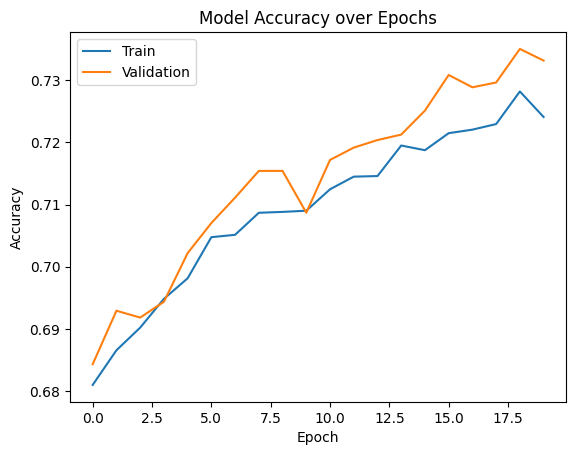

In [ ]:
plt.plot(history_1.history['accuracy'])
plt.plot(history_1.history['val_accuracy'])
plt.title('Model Accuracy over Epochs')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

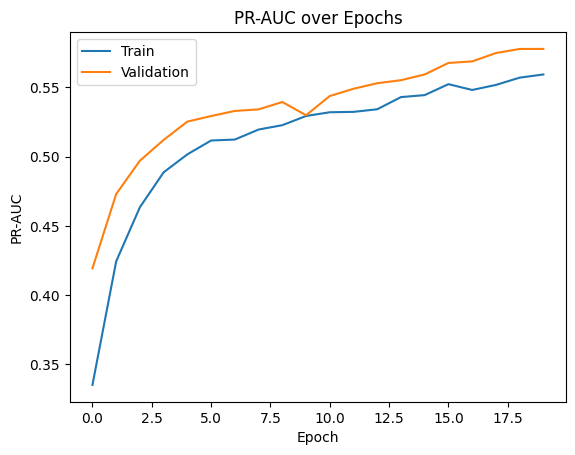

In [ ]:
plt.plot(history_1.history['pr_auc'])
plt.plot(history_1.history['val_pr_auc'])
plt.title('PR-AUC over Epochs')
plt.ylabel('PR-AUC')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'])
plt.show()

142/142 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step
Best threshold: 0.38016897
Precision: 0.5341614906832298
Recall: 0.749912800837112
F1: 0.6239117769171273
Best validation threshold: 0.38016897
Train performance metrics:
331/331 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step

Threshold used: 0.38016897

Confusion Matrix:
 [[10021  4449]
 [ 1695  4993]]

Classification Report:

              precision    recall  f1-score   support

           0       0.86      0.69      0.77     14470
           1       0.53      0.75      0.62      6688

    accuracy                           0.71     21158
   macro avg       0.69      0.72      0.69     21158
weighted avg       0.75      0.71      0.72     21158



,Accuracy,Recall (Class 1),Precision (Class 1),F1 (Class 1),ROC-AUC,PR-AUC
0,0.709613,0.746561,0.528807,0.619095,0.775508,0.573417


331/331 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step


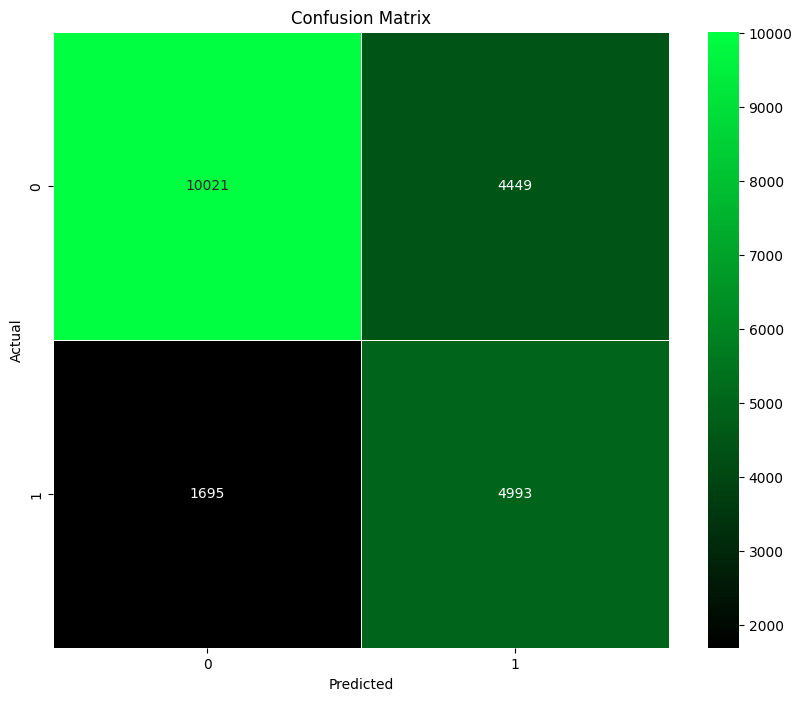

Validation performance metrics:
142/142 ━━━━━━━━━━━━━━━━━━━━ 21s 152ms/step

Threshold used: 0.38016897

Confusion Matrix:
 [[4327 1875]
 [ 718 2149]]

Classification Report:

              precision    recall  f1-score   support

           0       0.86      0.70      0.77      6202
           1       0.53      0.75      0.62      2867

    accuracy                           0.71      9069
   macro avg       0.70      0.72      0.70      9069
weighted avg       0.76      0.71      0.72      9069



,Accuracy,Recall (Class 1),Precision (Class 1),F1 (Class 1),ROC-AUC,PR-AUC
0,0.714081,0.749564,0.534046,0.623712,0.778757,0.578049


142/142 ━━━━━━━━━━━━━━━━━━━━ 7s 52ms/step


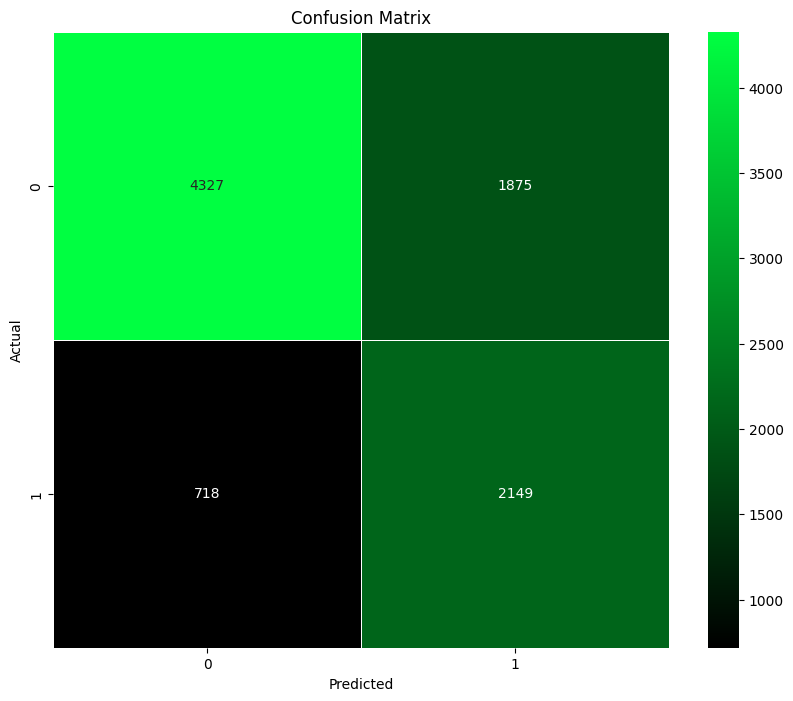

In [ ]:
# Get best threshold on Validation Set only
best_threshold = get_threshold(cnn_model_1, val_eval_gen)

print("Best validation threshold:", best_threshold)

# Evaluate Train Set using validation threshold
print("Train performance metrics:")
cnn_model_1_train_perf = model_performance_classification(
    cnn_model_1,
    train_eval_gen,
    threshold=best_threshold
)
display(cnn_model_1_train_perf)

plot_confusion_matrix(
    cnn_model_1,
    train_eval_gen,
    threshold=best_threshold
)

# Evaluate Validation Set using same threshold
print("Validation performance metrics:")
cnn_model_1_val_perf = model_performance_classification(
    cnn_model_1,
    val_eval_gen,
    threshold=best_threshold
)
display(cnn_model_1_val_perf)

plot_confusion_matrix(
    cnn_model_1,
    val_eval_gen,
    threshold=best_threshold
)

## **D.5: Vizualizing the predictions**

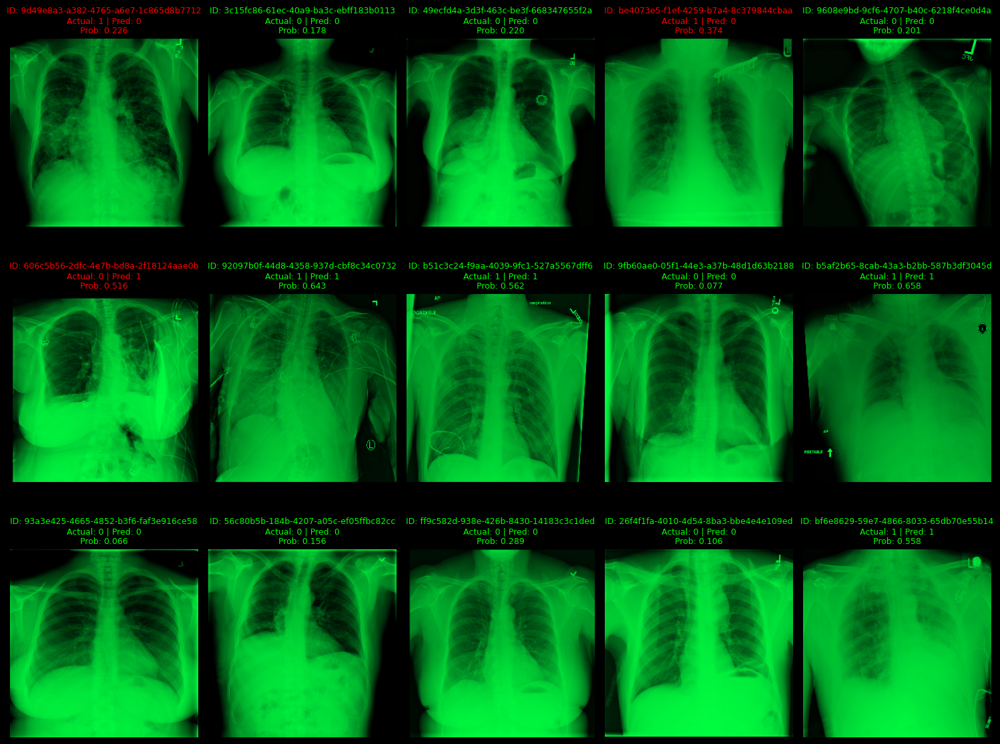

In [ ]:
visual_check_from_cache(
    cache_dir=processed_cache_train_dir,
    X_data=X_val,
    y_data=y_val,
    model=cnn_model_1,
    threshold=best_threshold,
    num_to_show=15
)

## **D.6: Prediction on Test data**

In [ ]:
processed_cache_test_dir = f"/content/processed_cache_test_{IMG_SIZE[0]}"


create_processed_cache_parallel(
    patient_ids=df_test["patientId"].unique(),
    raw_cache_dir=raw_cache_test_dir,
    processed_cache_dir=processed_cache_test_dir,
    img_size=IMG_SIZE,
    max_workers=4
)

100%|██████████| 3000/3000 [04:55<00:00, 10.14it/s]

Processed cache completed.
Created: 3000
Skipped: 0
Failed: 0


In [ ]:
test_gen = get_generator(
    df_test,   # Pass the DataFrame here, not its .values
    pd.Series(np.zeros(len(df_test))),   # dummy labels
    processed_cache_test_dir,
    batch_size=BATCH_SIZE,
    shuffle=False
)

In [ ]:
y_test_probs = cnn_model_1.predict(test_gen).reshape(-1)
y_test_pred = (y_test_probs > best_threshold).astype(int)

df_test["prediction_prob"] = y_test_probs
df_test["prediction"] = y_test_pred

df_test.head()

47/47 ━━━━━━━━━━━━━━━━━━━━ 11s 233ms/step


,patientId,prediction_prob,prediction
0,2392af63-9496-4e72-b348-9276432fd797,0.149840,0
1,2ce40417-1531-4101-be24-e85416c812cc,0.119824,0
2,2bc0fd91-931a-446f-becb-7a6d3f2a7678,0.128830,0
3,29d42f45-5046-4112-87fa-18ea6ea97e75,0.148275,0
4,208e3daf-18cb-4bf7-8325-0acf318ed62c,0.271620,0


In [ ]:
# Count
counts = df_test["prediction"].value_counts().sort_index()

# Percentage
percent = (counts / len(df_test)) * 100

summary_df = pd.DataFrame({
    "Count": counts,
    "Percentage (%)": percent.round(2)
})

print(summary_df)

            Count  Percentage (%)
prediction                       
0            1790           59.67
1            1210           40.33


In [ ]:
for cls in summary_df.index:
    print(f"Class {cls}: {summary_df.loc[cls, 'Count']} "
          f"({summary_df.loc[cls, 'Percentage (%)']}%)")

Class 0: 1790 (59.67%)
Class 1: 1210 (40.33%)


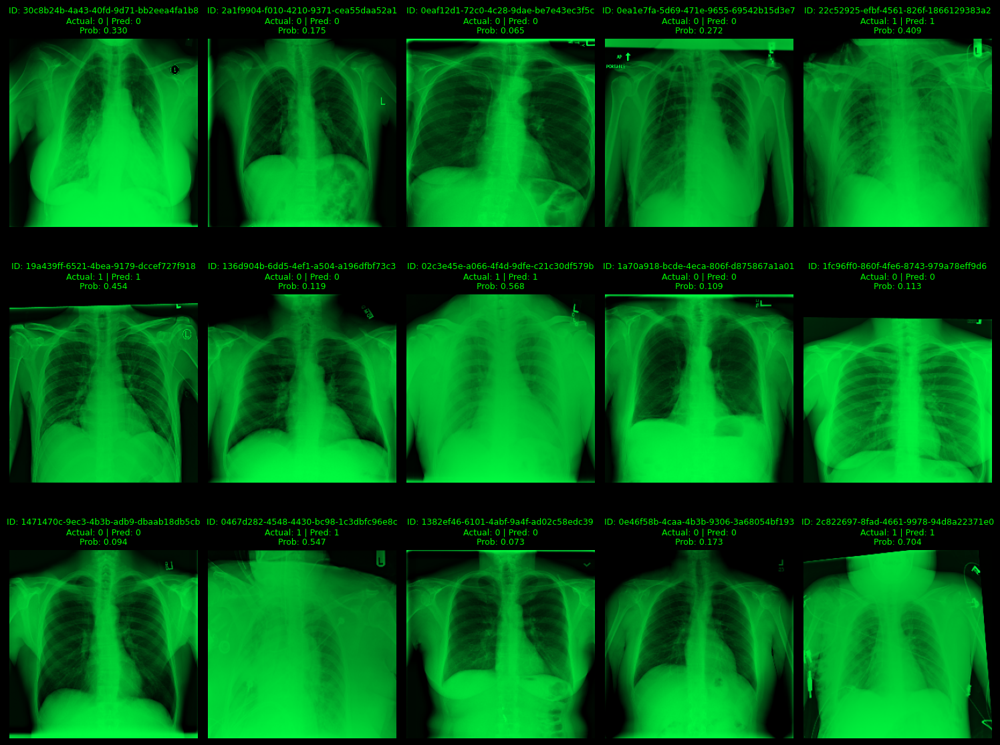

In [ ]:
visual_check_from_cache(
    cache_dir=processed_cache_test_dir,
    X_data=df_test,
    y_data=df_test["prediction"],   # using predicted labels
    model=cnn_model_1,
    threshold=best_threshold,
    num_to_show=15
)

## **D.7: Observation**

**Data processing and pipeline**
* In my execution, the memory utilization is high, but it is useful to reduce the execution time in a repeated process
* Successfully built an end-to-end pipeline: DICOM → .npy → processed cache → model
* Eliminated I/O bottleneck by caching → improved training speed significantly
* No data leakage between train and test (validated)
* Class imbalance present (~70% class 0 vs ~30% class 1)

**Image Standardization**
* Since all the images are in different size, first is to apply the image size of 256
* All images resized to 256×256 to ensure consistent input to CNN
* Eliminates variability in original DICOM resolutions
* Retains most spatial detail compared to lower resolutions

**Information Preservation**
* 256×256 retains fine-grained lung patterns
* Better captures subtle opacity regions than 128 or 224
* Particularly useful for faint pneumonia patterns

**Normalization Impact**
* Pixel values normalized to 0–1 range
* Reduces variability across images with different intensity distributions
* Improves model convergence and stability

**Computational Cost**
* Larger image size → higher memory usage
* Increased training time per epoch
* Higher I/O cost due to larger file size

**Pipeline Efficiency**
* Use of processed .npy cache significantly reduces preprocessing overhead
* Eliminates repeated DICOM decoding and resizing during training
* Enables smoother GPU utilization despite larger image size

**Trade-off Observed**
* 256×256 provides higher detail but slower training
* Not always translating to better generalization

Performance:
* Accuracy ~70–71%
* Recall (Class 1) ~75–76%
* Precision (Class 1) ~52–53%
* F1 Score ~0.62
* ROC-AUC ~0.77
* PR-AUC ~0.57

**Learning Behavior**
* Stable training and validation curves
* No significant overfitting observed
* Model generalizes reasonably well

**Recall vs Precision Trade-off**
* High recall → model detects most pneumonia cases
* Moderate precision → significant false positives
* Indicates bias toward class 1 predictions

**Confusion Matrix Insight**
* False positives are high
* False negatives are relatively low
* Model prioritizes detection over specificity

**Threshold Sensitivity**
* Default threshold (0.5) suboptimal
* Optimal threshold ~0.35–0.38
* Threshold tuning significantly improves F1 score

**Impact of Data Size**
* Performance improves significantly when training samples increase
* Small datasets lead to unstable predictions
* Larger datasets improve generalization

**Limitation Identified**
* Model performance limited by architecture (simple CNN)
* Increasing resolution alone does not significantly boost performance
* Indicates need for stronger feature extractor

** To Summarize**
Using 256×256 images ensures high information retention and stable learning but introduces computational overhead without proportionate performance gain. The model achieves good recall but suffers from moderate precision due to false positives. Performance improvements are more dependent on model architecture and threshold tuning than on further increasing image resolution.



# **E. Data Preprocessing - IMG SIZE 224**

## **E.1: Converting images to grayscale**

In [ ]:
IMG_SIZE = (224, 224)
BATCH_SIZE = 32
EPOCH = 15

**Grayscale Conversion Note**
- The input images are DICOM chest X-ray images and are already single-channel grayscale medical images.
- Therefore, explicit RGB to grayscale conversion was not required.
- The model input was standardized as `(height, width, 1)` by adding a channel dimension after preprocessing.

In [ ]:
def process_one_image(pid, raw_cache_dir, processed_cache_dir, img_size=IMG_SIZE):
    out_path = os.path.join(processed_cache_dir, f"{pid}.npy")

    if os.path.exists(out_path):
        return "skipped"

    raw_path = os.path.join(raw_cache_dir, f"{pid}.npy")

    try:
        img = np.load(raw_path).astype(np.float32)

        img = cv2.resize(img, img_size)
        img = cv2.normalize(img, None, 0, 1, cv2.NORM_MINMAX)
        img = np.expand_dims(img, axis=-1)

        np.save(out_path, img.astype(np.float32))
        return "created"

    except Exception as e:
        return f"failed: {pid} | {e}"


def create_processed_cache_parallel(
    patient_ids,
    raw_cache_dir,
    processed_cache_dir,
    img_size=IMG_SIZE,
    max_workers=8
):
    os.makedirs(processed_cache_dir, exist_ok=True)

    created = 0
    skipped = 0
    failed = []

    with ThreadPoolExecutor(max_workers=max_workers) as executor:
        futures = [
            executor.submit(
                process_one_image,
                pid,
                raw_cache_dir,
                processed_cache_dir,
                img_size
            )
            for pid in patient_ids
        ]

        for future in tqdm(as_completed(futures), total=len(futures)):
            result = future.result()

            if result == "created":
                created += 1
            elif result == "skipped":
                skipped += 1
            else:
                failed.append(result)

    print("Processed cache completed.")
    print("Created:", created)
    print("Skipped:", skipped)
    print("Failed:", len(failed))

    if failed:
        print("Sample failures:")
        for f in failed[:10]:
            print(f)

In [ ]:
processed_cache_train_dir = f"{google_path}/processed_cache_train_{IMG_SIZE[0]}"
#processed_cache_train_dir = f"/content/processed_cache_train_{IMG_SIZE[0]}"


create_processed_cache_parallel(
    patient_ids=df_train["patientId"].unique(),
    raw_cache_dir=raw_cache_train_dir,
    processed_cache_dir=processed_cache_train_dir,
    img_size=IMG_SIZE,
    max_workers=4
)

100%|██████████| 26684/26684 [59:17<00:00,  7.50it/s]


Processed cache completed.
Created: 26684
Skipped: 0
Failed: 0


In [ ]:
def view_processed_cache_images(
    cache_dir,
    label_data,
    target_column="Target",
    num_to_show=16
):
    random_indices = np.random.choice(len(label_data), size=num_to_show, replace=False)

    fig, axes = plt.subplots(4, 4, figsize=(15, 12))
    axes = axes.flatten()

    for i, idx in enumerate(random_indices):
        ax = axes[i]

        patient_id = str(label_data["patientId"].iloc[idx])
        label = label_data[target_column].iloc[idx]

        path = os.path.join(cache_dir, f"{patient_id}.npy")

        try:
            img = np.load(path)

            # processed cache already has shape (H, W, 1)
            img = np.squeeze(img)

            ax.imshow(img, cmap=medical_green)
            ax.set_title(f"{patient_id}\nTarget: {label}")

        except FileNotFoundError:
            ax.set_title(f"Missing:\n{patient_id}")

        except Exception as e:
            ax.set_title(f"Error:\n{patient_id}")

        ax.axis("off")

    plt.tight_layout()
    plt.show()

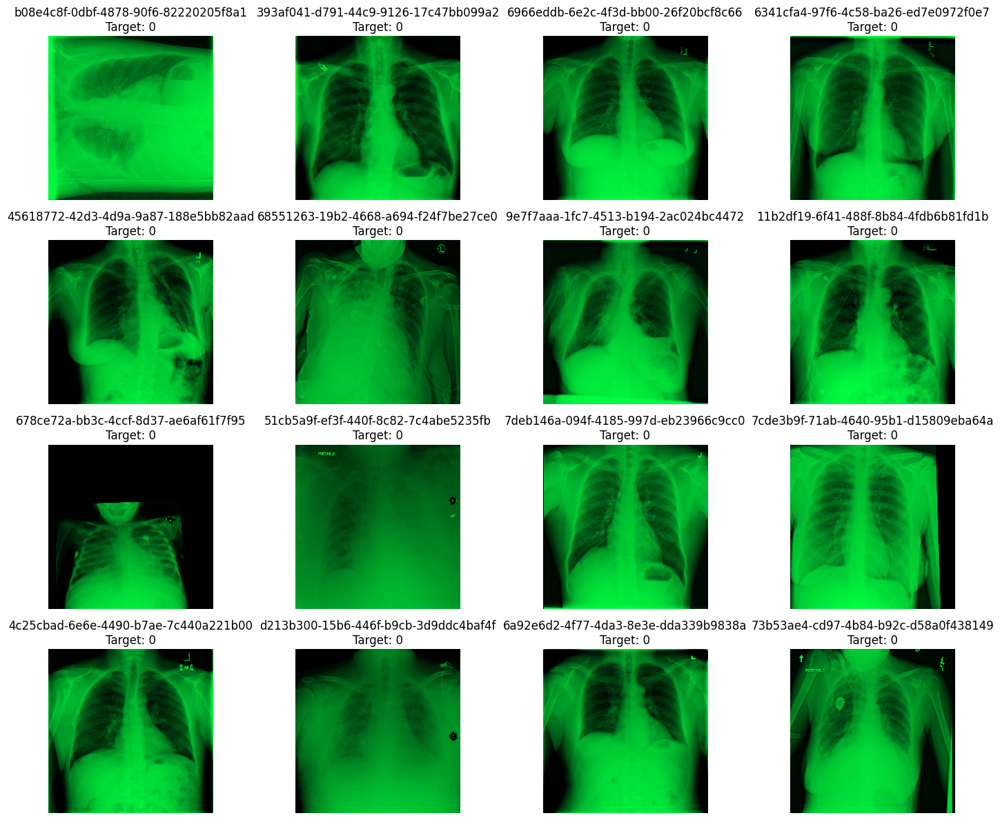

In [ ]:
view_processed_cache_images(
    cache_dir=processed_cache_train_dir,
    label_data=df_train[df_train['Target']==0],
    target_column="Target",
    num_to_show=16
)

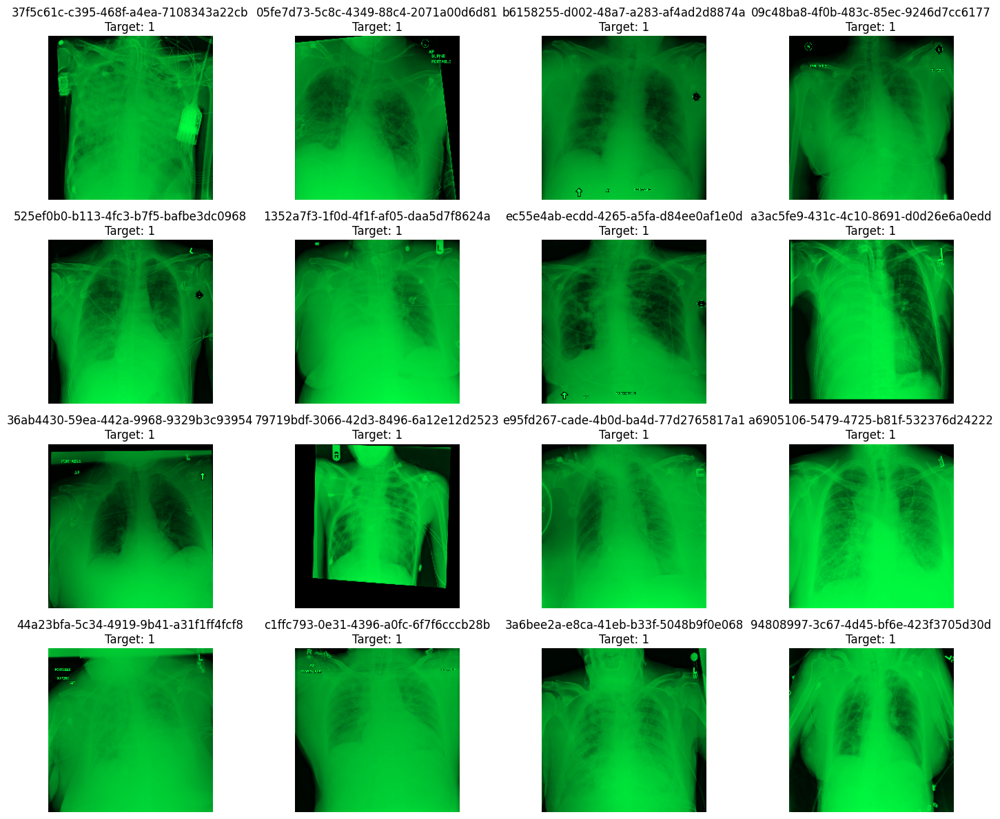

In [ ]:
view_processed_cache_images(
    cache_dir=processed_cache_train_dir,
    label_data=df_train[df_train['Target']==1],
    target_column="Target",
    num_to_show=16
)

## **E.2: Splitting the dataset**



In [ ]:
label_column_name = 'Target'

X = df_train[['patientId']]
y = df_train[label_column_name].astype(int)

# First split: 70% train, 30% temp (val+test)
X_train, X_val, y_train, y_val = train_test_split(
    X, y, test_size=0.3, random_state=42, stratify=y
)

print("--- Training Data ---")
print("Image shape:", X_train.shape)
print("Label shape:", y_train.shape)
print("\n--- Validation Data ---")
print("Image shape:", X_val.shape)
print("Label shape:", y_val.shape)

--- Training Data ---
Image shape: (21158, 1)
Label shape: (21158,)

--- Validation Data ---
Image shape: (9069, 1)
Label shape: (9069,)


**Train, Validation and Test Split Note**
- The labelled dataset was split into training and validation sets using stratified sampling.
- The test dataset was provided separately without labels and was used for final prediction/inference.
- Since test labels were not available, model performance was evaluated on the validation set, and predictions were generated for the test set.

## **E.3: Class weight**

In [ ]:
# make y_train 1D
y_train_flat = np.ravel(y_train).astype(int)

# check labels
print(np.unique(y_train_flat, return_counts=True))

# explicitly pass both binary classes
classes = np.array([0, 1])

weights = compute_class_weight(
    class_weight="balanced",
    classes=classes,
    y=y_train_flat
)

class_weights = dict(zip(classes, weights))
print(class_weights)

(array([0, 1]), array([14470,  6688]))
{np.int64(0): np.float64(0.7310988251554942), np.int64(1): np.float64(1.5817882775119618)}


In [ ]:
class_weights = {
    0: 1.0,
    1: 1.3
}

# **F. Model Building and evaluation - IMG SIZE 224**

## **F.1: Model Evaluation Criterion Functions**

In [ ]:
def get_threshold(model, generator):
    y_probs = model.predict(generator).reshape(-1)
    y_true = generator.labels

    precision, recall, thresholds = precision_recall_curve(y_true, y_probs)

    f1 = 2 * precision[:-1] * recall[:-1] / (
        precision[:-1] + recall[:-1] + 1e-8
    )

    best_idx = np.argmax(f1)
    best_threshold = thresholds[best_idx]

    print("Best threshold:", best_threshold)
    print("Precision:", precision[best_idx])
    print("Recall:", recall[best_idx])
    print("F1:", f1[best_idx])

    return best_threshold


In [ ]:
def model_performance_classification(model, generator, threshold=0.5):


    # Predictions
    y_pred_probs = model.predict(generator, verbose=1).reshape(-1)
    y_pred = (y_pred_probs > threshold).astype(int)

    # True labels
    y_true = generator.labels

    # Metrics
    acc = accuracy_score(y_true, y_pred)

    recall_1 = recall_score(y_true, y_pred, pos_label=1)
    precision_1 = precision_score(y_true, y_pred, pos_label=1)
    f1_1 = f1_score(y_true, y_pred, pos_label=1)

    # AUCs
    roc_auc = roc_auc_score(y_true, y_pred_probs)
    pr_auc = average_precision_score(y_true, y_pred_probs)

    # Confusion Matrix
    cm = confusion_matrix(y_true, y_pred)

    print("\nThreshold used:", threshold)
    print("\nConfusion Matrix:\n", cm)

    print("\nClassification Report:\n")
    print(classification_report(y_true, y_pred))

    df_perf = pd.DataFrame({
        "Accuracy": [acc],
        "Recall (Class 1)": [recall_1],
        "Precision (Class 1)": [precision_1],
        "F1 (Class 1)": [f1_1],
        "ROC-AUC": [roc_auc],
        "PR-AUC": [pr_auc]
    })

    return df_perf

In [ ]:
def plot_confusion_matrix(model, generator, threshold=0.5):
    """
    Modified to handle Keras Sequence Generators for DICOM data
    """

    # 1. Get all true labels from the generator
    y_true = generator.labels

    # 2. Get predictions for the entire generator
    # Setting shuffle=False is critical to keep labels and predictions aligned
    y_pred_probs = model.predict(generator, verbose=1)
    y_pred = (y_pred_probs.reshape(-1) > threshold).astype(int)

    # 3. Compute Confusion Matrix
    cm = tf.math.confusion_matrix(y_true, y_pred)

    # 4. Plotting
    plt.figure(figsize=(10, 8))
    sns.heatmap(
        cm,
        annot=True,
        linewidths=.4,
        fmt="d",
        square=True,
        cmap=medical_green
    )
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title('Confusion Matrix')
    plt.show()

In [ ]:
def visual_check_from_cache(
    cache_dir,
    X_data,
    y_data,
    model,
    threshold=0.5,
    num_to_show=16
):
    total_images = len(X_data)
    random_indices = np.random.choice(total_images, size=num_to_show, replace=False)

    cols = 5
    rows = math.ceil(num_to_show / cols)

    fig, axes = plt.subplots(rows, cols, figsize=(15, 4 * rows), facecolor="black")
    axes = axes.flatten()

    for i, idx in enumerate(random_indices):
        ax = axes[i]

        patient_id = str(X_data["patientId"].iloc[idx])

        if hasattr(y_data, "iloc"):
            true_label = int(y_data.iloc[idx])
        else:
            true_label = int(y_data[idx])

        cache_path = os.path.join(cache_dir, f"{patient_id}.npy")

        try:
            img = np.load(cache_path).astype(np.float32)

            # expected processed shape: (256, 256, 1)
            img_for_model = np.expand_dims(img, axis=0)

            prediction_prob = model.predict(img_for_model, verbose=0)[0][0]
            pred_label = 1 if prediction_prob > threshold else 0

            img_display = np.squeeze(img)

            ax.imshow(img_display, cmap=medical_green)

            title_color = "lime" if pred_label == true_label else "red"
            ax.set_title(
                f"ID: {patient_id}\nActual: {true_label} | Pred: {pred_label}\nProb: {prediction_prob:.3f}",
                color=title_color,
                fontsize=9
            )

        except FileNotFoundError:
            ax.set_title(f"Missing cache:\n{patient_id}", color="yellow")

        except Exception as e:
            ax.set_title(f"Error:\n{patient_id}\n{str(e)[:30]}", color="yellow")

        ax.axis("off")

    for j in range(i + 1, len(axes)):
        axes[j].axis("off")

    plt.tight_layout()
    plt.show()

## **F.2: Model 1: Simple Convolutional Neural Network (CNN)**

In [ ]:
X_train.shape

(21158, 1)

In [ ]:
class ProcessedNpyDataGenerator(Sequence):
    def __init__(self, patient_ids, labels, cache_dir, batch_size=BATCH_SIZE, shuffle=True):
        self.patient_ids = np.array(patient_ids)
        self.labels = np.array(labels).astype(int)
        self.cache_dir = cache_dir
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.indices = np.arange(len(self.patient_ids))
        self.on_epoch_end()

    def __len__(self):
        return int(np.ceil(len(self.patient_ids) / self.batch_size))

    def __getitem__(self, idx):
        batch_indices = self.indices[idx*self.batch_size:(idx+1)*self.batch_size]

        images, labels = [], []

        for i in batch_indices:
            pid = self.patient_ids[i]
            img = np.load(os.path.join(self.cache_dir, f"{pid}.npy"))

            images.append(img)
            labels.append(self.labels[i])

        return np.array(images, dtype=np.float32), np.array(labels)

    def on_epoch_end(self):
        if self.shuffle:
            np.random.shuffle(self.indices)

In [ ]:
mixed_precision.set_global_policy("mixed_float16")

In [ ]:
img_size = IMG_SIZE

cnn_model_1 = Sequential([
    Conv2D(32, (3,3), activation='relu', padding='same',
           input_shape=(IMG_SIZE[0],IMG_SIZE[1],1)),
    MaxPooling2D(2,2),

    Conv2D(64, (3,3), activation='relu', padding='same'),
    MaxPooling2D(2,2),

    Conv2D(128, (3,3), activation='relu', padding='same'),
    MaxPooling2D(2,2),

    GlobalAveragePooling2D(),

    Dense(64, activation='relu'),
    Dropout(0.3),

    Dense(1, activation='sigmoid', dtype='float32')
])

cnn_model_1.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss='binary_crossentropy',
    metrics=[
        'accuracy',
        tf.keras.metrics.AUC(name='roc_auc'),
        tf.keras.metrics.AUC(name='pr_auc', curve='PR'),
        tf.keras.metrics.Recall(name='recall'),
        tf.keras.metrics.Precision(name='precision')
    ]
)

In [ ]:
cnn_model_1.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)               │ (None, 224, 224, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 100,993 (394.50 KB)

 Trainable params: 100,993 (394.50 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
X_train_temp = X_train.copy()
y_train_temp = y_train.copy()
X_val_temp = X_val.copy()
y_val_temp = y_val.copy()

In [ ]:
y_train_temp

,Target
30097,1
23456,0
14645,0
6482,1
6567,0
...,...
2537,0
477,0
6348,0
25346,0


In [ ]:
def get_generator(X, y, path, batch_size, shuffle):
    return ProcessedNpyDataGenerator(
        X["patientId"].values,
        y.values,
        path,
        batch_size=batch_size,
        shuffle=shuffle
    )

In [ ]:
train_gen = get_generator(X_train_temp, y_train_temp, processed_cache_train_dir, BATCH_SIZE, shuffle=True)
val_gen = get_generator(X_val_temp, y_val_temp, processed_cache_train_dir, BATCH_SIZE, shuffle=False)

train_eval_gen = get_generator(X_train_temp, y_train_temp, processed_cache_train_dir, BATCH_SIZE, shuffle=False)
val_eval_gen = get_generator(X_val_temp, y_val_temp, processed_cache_train_dir, BATCH_SIZE, shuffle=False)

## **F.3: Training the Model**

In [ ]:
callbacks = [
    tf.keras.callbacks.EarlyStopping(
        monitor='val_pr_auc',
        mode='max',
        patience=4,
        restore_best_weights=True
    ),
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor='val_pr_auc',
        mode='max',
        factor=0.3,
        patience=2,
        min_lr=1e-7
    )
]

history_1 = cnn_model_1.fit(
    train_gen,
    validation_data=val_gen,
    epochs=20,
    callbacks=callbacks,
    class_weight=class_weights,
    verbose=2
)

Epoch 1/20
662/662 - 475s - 718ms/step - accuracy: 0.6829 - loss: 0.7190 - pr_auc: 0.3631 - precision: 0.4472 - recall: 0.0133 - roc_auc: 0.5616 - val_accuracy: 0.6929 - val_loss: 0.6093 - val_pr_auc: 0.4781 - val_precision: 0.7135 - val_recall: 0.0478 - val_roc_auc: 0.6565 - learning_rate: 1.0000e-04
Epoch 2/20
662/662 - 157s - 237ms/step - accuracy: 0.6901 - loss: 0.6791 - pr_auc: 0.4681 - precision: 0.5210 - recall: 0.2451 - roc_auc: 0.6793 - val_accuracy: 0.6979 - val_loss: 0.5720 - val_pr_auc: 0.5119 - val_precision: 0.5312 - val_recall: 0.3774 - val_roc_auc: 0.7275 - learning_rate: 1.0000e-04
Epoch 3/20
662/662 - 156s - 235ms/step - accuracy: 0.6983 - loss: 0.6502 - pr_auc: 0.4986 - precision: 0.5296 - recall: 0.4067 - roc_auc: 0.7215 - val_accuracy: 0.7038 - val_loss: 0.5527 - val_pr_auc: 0.5286 - val_precision: 0.5424 - val_recall: 0.4039 - val_roc_auc: 0.7430 - learning_rate: 1.0000e-04
Epoch 4/20
662/662 - 157s - 238ms/step - accuracy: 0.7038 - loss: 0.6374 - pr_auc: 0.5092 -

## **F.4: Evaluation**

In [ ]:
y_probs = cnn_model_1.predict(val_gen).reshape(-1)
y_pred = (y_probs > 0.5).astype(int)

print("Val labels:", np.unique(val_gen.labels, return_counts=True))
print("Pred labels:", np.unique(y_pred, return_counts=True))
print("Mean prob:", y_probs.mean())
print("Min prob:", y_probs.min())
print("Max prob:", y_probs.max())

284/284 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step
Val labels: (array([0, 1]), array([6202, 2867]))
Pred labels: (array([0, 1]), array([6723, 2346]))
Mean prob: 0.31707275
Min prob: 0.024806235
Max prob: 0.78294706


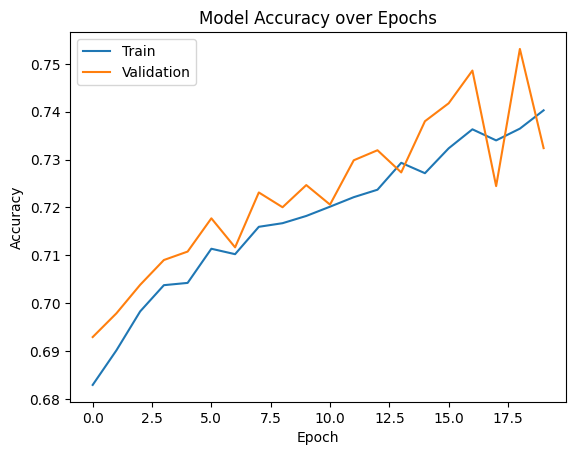

In [ ]:
plt.plot(history_1.history['accuracy'])
plt.plot(history_1.history['val_accuracy'])
plt.title('Model Accuracy over Epochs')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

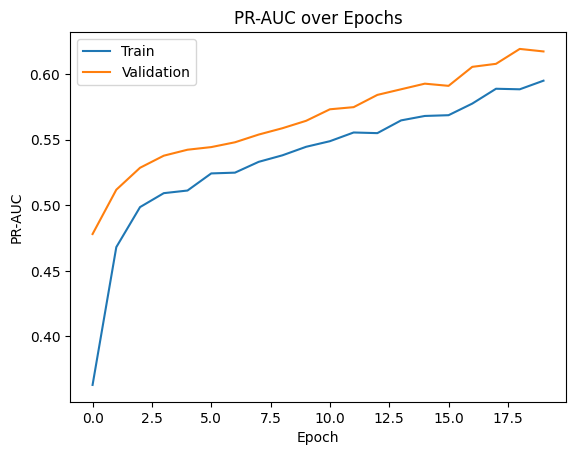

In [ ]:
plt.plot(history_1.history['pr_auc'])
plt.plot(history_1.history['val_pr_auc'])
plt.title('PR-AUC over Epochs')
plt.ylabel('PR-AUC')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'])
plt.show()

284/284 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step
Best threshold: 0.34217992
Precision: 0.54455689953098
Recall: 0.769445413324032
F1: 0.6377565721918466
Best validation threshold: 0.34217992
Train performance metrics:
662/662 ━━━━━━━━━━━━━━━━━━━━ 114s 172ms/step

Threshold used: 0.34217992

Confusion Matrix:
 [[10098  4372]
 [ 1583  5105]]

Classification Report:

              precision    recall  f1-score   support

           0       0.86      0.70      0.77     14470
           1       0.54      0.76      0.63      6688

    accuracy                           0.72     21158
   macro avg       0.70      0.73      0.70     21158
weighted avg       0.76      0.72      0.73     21158



,Accuracy,Recall (Class 1),Precision (Class 1),F1 (Class 1),ROC-AUC,PR-AUC
0,0.718546,0.763307,0.538673,0.631612,0.792045,0.613623


662/662 ━━━━━━━━━━━━━━━━━━━━ 107s 162ms/step


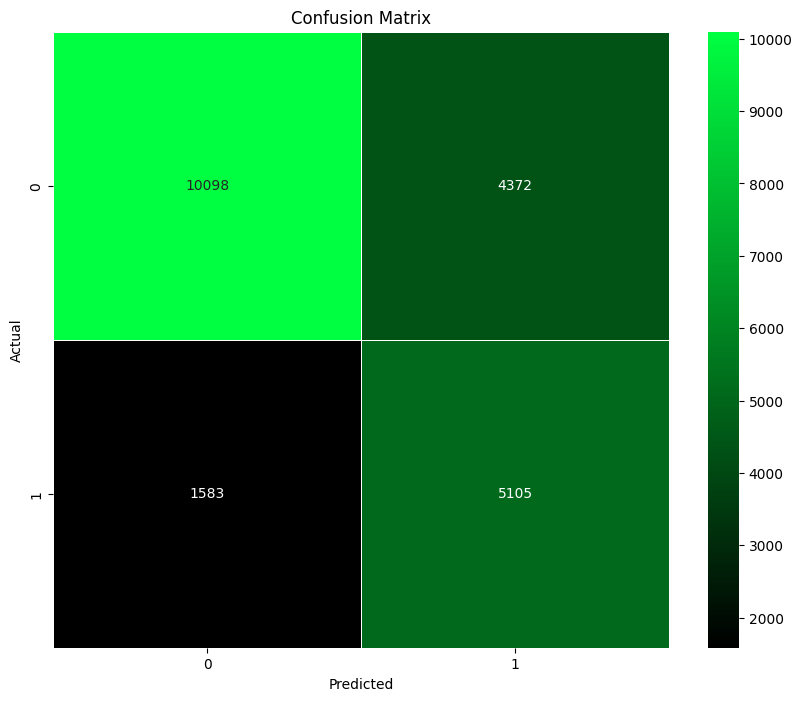

Validation performance metrics:
284/284 ━━━━━━━━━━━━━━━━━━━━ 47s 166ms/step

Threshold used: 0.34217992

Confusion Matrix:
 [[4357 1845]
 [ 662 2205]]

Classification Report:

              precision    recall  f1-score   support

           0       0.87      0.70      0.78      6202
           1       0.54      0.77      0.64      2867

    accuracy                           0.72      9069
   macro avg       0.71      0.74      0.71      9069
weighted avg       0.77      0.72      0.73      9069



,Accuracy,Recall (Class 1),Precision (Class 1),F1 (Class 1),ROC-AUC,PR-AUC
0,0.723564,0.769097,0.544444,0.63756,0.79752,0.619581


284/284 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step


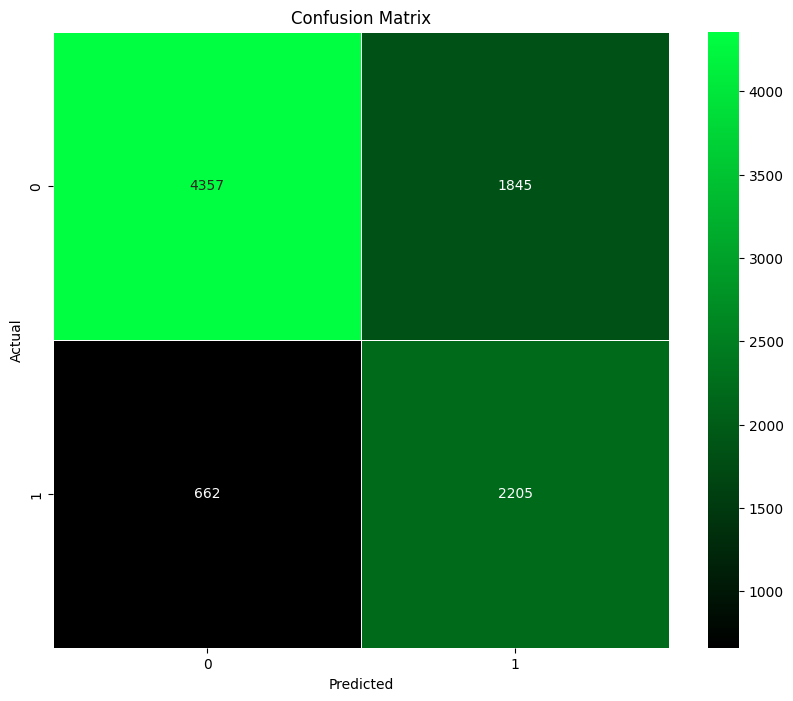

In [ ]:
# Get best threshold on Validation Set only
best_threshold = get_threshold(cnn_model_1, val_eval_gen)

print("Best validation threshold:", best_threshold)

# Evaluate Train Set using validation threshold
print("Train performance metrics:")
cnn_model_1_train_perf = model_performance_classification(
    cnn_model_1,
    train_eval_gen,
    threshold=best_threshold
)
display(cnn_model_1_train_perf)

plot_confusion_matrix(
    cnn_model_1,
    train_eval_gen,
    threshold=best_threshold
)

# Evaluate Validation Set using same threshold
print("Validation performance metrics:")
cnn_model_1_val_perf = model_performance_classification(
    cnn_model_1,
    val_eval_gen,
    threshold=best_threshold
)
display(cnn_model_1_val_perf)

plot_confusion_matrix(
    cnn_model_1,
    val_eval_gen,
    threshold=best_threshold
)

## **F.5: Vizualizing the predictions**

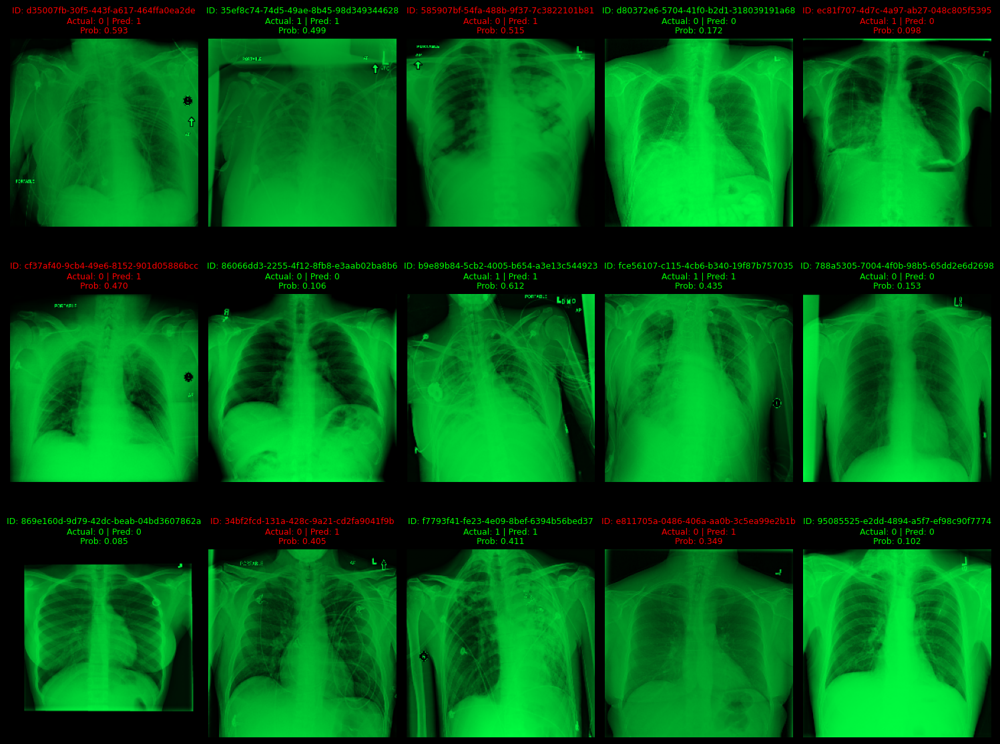

In [ ]:
visual_check_from_cache(
    cache_dir=processed_cache_train_dir,
    X_data=X_val,
    y_data=y_val,
    model=cnn_model_1,
    threshold=best_threshold,
    num_to_show=15
)

## **F.6: Prediction on Test data**

In [ ]:
#processed_cache_test_dir = f"/content/processed_cache_test_{IMG_SIZE[0]}"

processed_cache_test_dir = f"{google_path}/processed_cache_test_{IMG_SIZE[0]}"

create_processed_cache_parallel(
    patient_ids=df_test["patientId"].unique(),
    raw_cache_dir=raw_cache_test_dir,
    processed_cache_dir=processed_cache_test_dir,
    img_size=IMG_SIZE,
    max_workers=4
)

100%|██████████| 3000/3000 [08:32<00:00,  5.86it/s]

Processed cache completed.
Created: 3000
Skipped: 0
Failed: 0


In [ ]:
test_gen = get_generator(
    df_test,   # Pass the DataFrame here, not its .values
    pd.Series(np.zeros(len(df_test))),   # dummy labels
    processed_cache_test_dir,
    batch_size=BATCH_SIZE,
    shuffle=False
)

In [ ]:
y_test_probs = cnn_model_1.predict(test_gen).reshape(-1)
y_test_pred = (y_test_probs > best_threshold).astype(int)

df_test["prediction_prob"] = y_test_probs
df_test["prediction"] = y_test_pred

df_test.head()

94/94 ━━━━━━━━━━━━━━━━━━━━ 16s 171ms/step


,patientId,prediction_prob,prediction
0,2392af63-9496-4e72-b348-9276432fd797,0.139365,0
1,2ce40417-1531-4101-be24-e85416c812cc,0.143022,0
2,2bc0fd91-931a-446f-becb-7a6d3f2a7678,0.096872,0
3,29d42f45-5046-4112-87fa-18ea6ea97e75,0.138830,0
4,208e3daf-18cb-4bf7-8325-0acf318ed62c,0.162132,0


In [ ]:
# Count
counts = df_test["prediction"].value_counts().sort_index()

# Percentage
percent = (counts / len(df_test)) * 100

summary_df = pd.DataFrame({
    "Count": counts,
    "Percentage (%)": percent.round(2)
})

print(summary_df)

            Count  Percentage (%)
prediction                       
0            1792           59.73
1            1208           40.27


In [ ]:
for cls in summary_df.index:
    print(f"Class {cls}: {summary_df.loc[cls, 'Count']} "
          f"({summary_df.loc[cls, 'Percentage (%)']}%)")

Class 0: 1792 (59.73%)
Class 1: 1208 (40.27%)


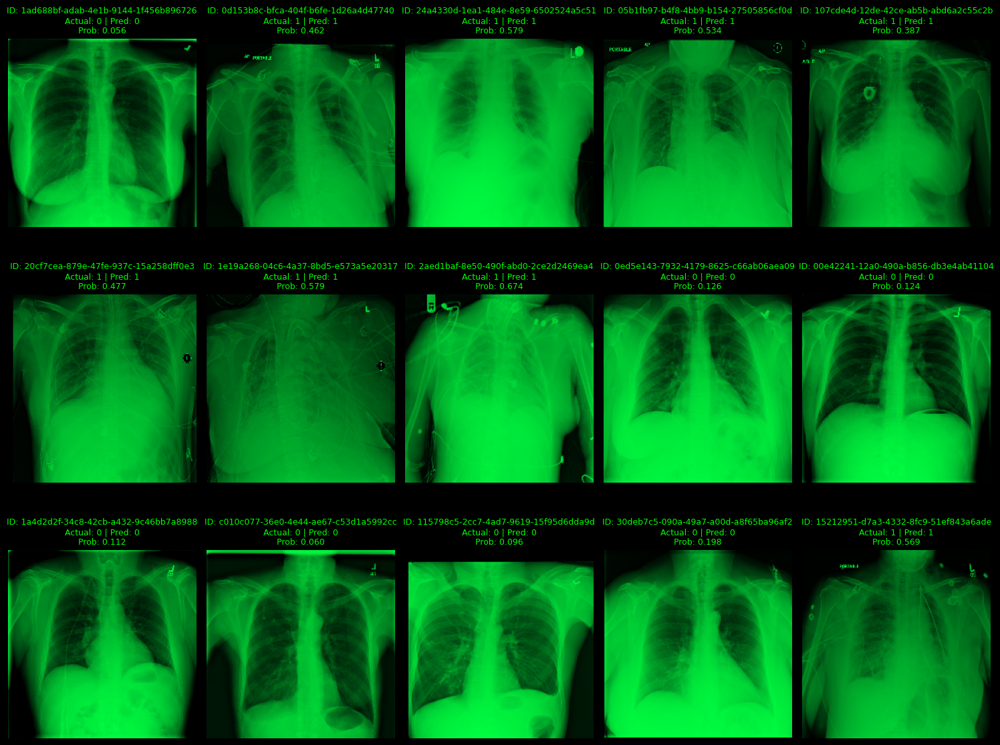

In [ ]:
visual_check_from_cache(
    cache_dir=processed_cache_test_dir,
    X_data=df_test,
    y_data=df_test["prediction"],   # using predicted labels
    model=cnn_model_1,
    threshold=best_threshold,
    num_to_show=15
)

## **F.7: Observation**

**Data processing and pipeline**

* In my execution, the memory utilization is relatively lower compared to 256, improving overall efficiency
* Successfully built an end-to-end pipeline: DICOM → .npy → processed cache → model
* Eliminated I/O bottleneck by caching → significantly improved training speed
* No data leakage between train and test (validated)
* Class imbalance present (~70% class 0 vs ~30% class 1)

**Image Standardization**

* Since all the images are in different sizes, resizing is applied to a standard size of 224×224
* All images resized to 224×224 to ensure consistent input to CNN
* Eliminates variability in original DICOM resolutions
* Provides sufficient spatial resolution for capturing lung patterns

**Information Preservation**

* 224×224 retains most clinically relevant lung patterns
* Slight reduction in fine-grained detail compared to 256×256
* Still effectively captures opacity regions and pneumonia indicators
* Provides a good balance between detail and efficiency

**Normalization Impact**

* Pixel values normalized to 0–1 range
* Reduces variability across images with different intensity distributions
* Improves model convergence and training stability

**Computational Cost**

* Reduced image size → lower memory usage
* Faster training time per epoch compared to 256
* Lower I/O cost due to smaller file size

**Pipeline Efficiency**

* Use of processed .npy cache significantly reduces preprocessing overhead
* Eliminates repeated DICOM decoding and resizing during training
* Enables better GPU utilization and faster batch processing

**Trade-off Observed**

* 224×224 provides a balance between image detail and training efficiency
* Slight loss of resolution does not negatively impact model performance
* Improves generalization compared to higher resolution

**Performance**

* Accuracy ~72–73%
* Recall (Class 1) ~76–77%
* Precision (Class 1) ~54–55%
* F1 Score ~0.63–0.64
* ROC-AUC ~0.79–0.80
* PR-AUC ~0.61–0.62

**Learning Behavior**

* Stable training and validation curves
* No significant overfitting observed
* Validation performance slightly better than training → strong generalization

**Recall vs Precision Trade-off**

* High recall → model effectively detects pneumonia cases
* Improved precision compared to 256 → reduced false positives
* Better balance between recall and precision

**Confusion Matrix Insight**

* False positives reduced compared to 256
* False negatives remain low
* Model maintains strong detection capability with improved specificity

**Threshold Sensitivity**

* Default threshold (0.5) remains suboptimal
* Optimal threshold ~0.33–0.38
* Threshold tuning significantly improves F1 and precision

**Impact of Data Size**

* Performance improves significantly with increased training samples
* Model becomes more stable with larger datasets
* 224 size benefits more from increased data compared to 256

**Limitation Identified**

* Model performance still limited by CNN architecture
* Further gains require advanced architectures (DenseNet/EfficientNet)
* Resolution alone is not the primary limiting factor

**Comparison: 256 vs 224**

* 256×256 provides higher detail but slower training
* 224×224 provides faster training and better generalization
* Precision improves from ~52–53% to ~54–55%
* F1 score improves from ~0.62 to ~0.64
* PR-AUC improves from ~0.57 to ~0.62
* 224×224 offers better overall efficiency and performance balance

**To Summarize**

* Using 224×224 images provides an optimal balance between computational efficiency and predictive performance
* While 256×256 retains slightly more detail, it does not translate into significant performance gains
* The 224×224 configuration improves generalization, increases PR-AUC and F1-score, and reduces training time
* Performance improvements are now primarily dependent on model architecture and threshold tuning rather than further increasing image resolution

# **G: Conclusion - Interim:**

* The developed CNN-based pneumonia detection model demonstrates stable learning and good generalization on chest X-ray data. The pipeline effectively handles large-scale medical imaging through caching and preprocessing optimizations.
* The model achieves strong recall, ensuring most pneumonia cases are detected, which is critical in healthcare scenarios. However, it exhibits moderate precision due to higher false positives, indicating room for improvement in specificity.
* Resolution tuning (224×224) provides an optimal balance between computational efficiency and predictive performance. Additionally, threshold optimization significantly enhances model performance compared to default classification thresholds.
* Overall, the system serves as a robust baseline solution, with performance primarily limited by model capacity rather than data pipeline or training issues.
* Reducing further in the image size will result in loosing critical information as the images are captured from various machine
* As next step need to try with the more sofisticated tried models like DenseNet121

# **H: Business Recommendations - Interim:**

**Clinical Safety First**
* Prioritize recall over precision
* Missing pneumonia (FN) is more costly than false alarms (FP)
* Current model is suitable for screening use-case

**Threshold Customization by Use Case**
* Screening system → use lower threshold (~0.35)
* Diagnostic support → use higher threshold (~0.45–0.5)
* Allows tuning based on operational needs

**Improve Precision (Reduce False Positives)**
* Introduce class weighting or focal loss
* Add data augmentation for better generalization
* Move to advanced architectures (DenseNet121)

**Model Upgrade Strategy**
* Current CNN = baseline
* Next step:
    - DenseNet121 / EfficientNet
    - Expected improvement: +10–15% PR-AUC

**Production Deployment Strategy**
* Use cached preprocessing pipeline for fast inference
* Deploy model as:
    - Batch scoring system OR
    - Real-time inference API

**Monitoring in Production**
* Track:
    - False positives rate
    - Recall (critical)
* Periodically retrain with new data

**ROI Perspective**
* Reduces radiologist workload
* Acts as first-level screening tool
* Improves early detection of pneumonia


# **I: Transfer Learning - DenseNet121 - Base Model**

## **I.1: Base Model**

Since the custom CNN model was giving around 76% of the recall, lets try a pre-trained model.

Why DenseNet121?

* DenseNet121 was selected because its dense connectivity
architecture enables efficient feature reuse and stronger feature extraction, making it highly effective for medical image classification tasks.
* Compared to the CNN models developed from scratch, DenseNet121 achieved significantly higher Accuracy, Recall, ROC-AUC, and PR-AUC, demonstrating superior capability in identifying pneumonia-related patterns in chest X-ray images.

In [19]:
IMG_SIZE = (224, 224)
BATCH_SIZE = 16
EPOCHS = 10

In [20]:
label_column_name = 'Target'

X = df_train[['patientId']]
y = df_train[label_column_name].astype(int)

# First split: 70% train, 30% temp (val+test)
X_train, X_val, y_train, y_val = train_test_split(
    X, y, test_size=0.3, random_state=42, stratify=y
)

print("--- Training Data ---")
print("Image shape:", X_train.shape)
print("Label shape:", y_train.shape)
print("\n--- Validation Data ---")
print("Image shape:", X_val.shape)
print("Label shape:", y_val.shape)

--- Training Data ---
Image shape: (21158, 1)
Label shape: (21158,)

--- Validation Data ---
Image shape: (9069, 1)
Label shape: (9069,)


## **I.2: Convert to shard file**

For Faster execution, the processed npy are convered into modules of shard files

In [21]:
import os
import numpy as np
from tqdm import tqdm

def create_npz_shards(X_df, y_series, cache_dir, output_dir, shard_size=2000):
    os.makedirs(output_dir, exist_ok=True)

    patient_ids = X_df["patientId"].values
    labels = y_series.values.astype(int)

    total = len(patient_ids)
    shard_num = 0

    for start in tqdm(range(0, total, shard_size)):
        end = min(start + shard_size, total)

        shard_ids = patient_ids[start:end]
        shard_labels = labels[start:end]

        images = []
        valid_labels = []
        valid_ids = []

        for pid, label in zip(shard_ids, shard_labels):
            img_path = os.path.join(cache_dir, f"{pid}.npy")

            if not os.path.exists(img_path):
                continue

            img = np.load(img_path).astype(np.float32)
            images.append(img)
            valid_labels.append(label)
            valid_ids.append(pid)

        images = np.array(images, dtype=np.float32)
        valid_labels = np.array(valid_labels, dtype=np.int32)
        valid_ids = np.array(valid_ids)

        shard_path = os.path.join(output_dir, f"shard_{shard_num:03d}.npz")

        np.savez_compressed(
            shard_path,
            images=images,
            labels=valid_labels,
            patient_ids=valid_ids
        )

        shard_num += 1

    print("Sharding completed.")

In [22]:
processed_cache_train_dir = f"{google_path}/processed_cache_train_{IMG_SIZE[0]}"
shard_train_dir = f"{google_path}/train_shards_{IMG_SIZE[0]}"

create_npz_shards(
    X_train,
    y_train,
    processed_cache_train_dir,
    shard_train_dir,
    shard_size=2000
)

shard_val_dir = f"{google_path}/val_shards_{IMG_SIZE[0]}"

create_npz_shards(
    X_val,
    y_val,
    processed_cache_train_dir,
    shard_val_dir,
    shard_size=2000
)

In [23]:
import os
import numpy as np

def validate_shards(shard_dir):
    total_images = 0
    total_labels = 0

    shard_files = sorted([
        f for f in os.listdir(shard_dir)
        if f.endswith(".npz")
    ])

    print("Number of shards:", len(shard_files))

    for shard in shard_files:
        data = np.load(os.path.join(shard_dir, shard))

        images = data["images"]
        labels = data["labels"]

        total_images += len(images)
        total_labels += len(labels)

    print("Total images in shards :", total_images)
    print("Total labels in shards :", total_labels)

    return total_images

In [24]:
shard_count = validate_shards(shard_train_dir)

expected = len(X_train)

print("Expected:", expected)
print("In shards:", shard_count)
print("Missing :", expected - shard_count)

shard_count = validate_shards(shard_val_dir)

expected = len(X_val)

print("Expected:", expected)
print("In shards:", shard_count)
print("Missing :", expected - shard_count)

Number of shards: 11
Total images in shards : 21158
Total labels in shards : 21158
Expected: 21158
In shards: 21158
Missing : 0
Number of shards: 5
Total images in shards : 9069
Total labels in shards : 9069
Expected: 9069
In shards: 9069
Missing : 0


## **I.3: Model training base model**

Training the base module, without any changes

In [25]:
import os
import numpy as np
from tensorflow.keras.utils import Sequence

class ShardDataGenerator3Channel(Sequence):
    def __init__(self, shard_dir, batch_size=32, shuffle=True):
        self.shard_dir = shard_dir
        self.batch_size = batch_size
        self.shuffle = shuffle

        self.shard_files = sorted([
            os.path.join(shard_dir, f)
            for f in os.listdir(shard_dir)
            if f.endswith(".npz")
        ])

        self.images = []
        self.labels = []

        for shard_path in self.shard_files:
            data = np.load(shard_path)
            self.images.append(data["images"])
            self.labels.append(data["labels"])

        self.images = np.concatenate(self.images, axis=0)
        self.labels = np.concatenate(self.labels, axis=0).astype(int)

        self.indices = np.arange(len(self.labels))
        self.on_epoch_end()

    def __len__(self):
        return int(np.ceil(len(self.labels) / self.batch_size))

    def __getitem__(self, idx):
        batch_indices = self.indices[idx*self.batch_size:(idx+1)*self.batch_size]

        batch_images = self.images[batch_indices]
        batch_labels = self.labels[batch_indices]

        # Convert grayscale (N, H, W, 1) to RGB-like (N, H, W, 3)
        if batch_images.shape[-1] == 1:
            batch_images = np.repeat(batch_images, 3, axis=-1)

        return batch_images.astype(np.float32), batch_labels

    def on_epoch_end(self):
        if self.shuffle:
            np.random.shuffle(self.indices)

In [26]:
train_shard_dir = shard_train_dir
val_shard_dir = shard_val_dir

train_gen_tl = ShardDataGenerator3Channel(
    train_shard_dir,
    batch_size=32,
    shuffle=True
)

val_gen_tl = ShardDataGenerator3Channel(
    val_shard_dir,
    batch_size=32,
    shuffle=False
)

val_eval_gen_tl = ShardDataGenerator3Channel(
    val_shard_dir,
    batch_size=32,
    shuffle=False
)

In [27]:
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.models import Model

base_model = DenseNet121(
    weights="imagenet",
    include_top=False,
    input_shape=(IMG_SIZE[0], IMG_SIZE[1], 3)
)

base_model.trainable = False

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(128, activation="relu")(x)
x = Dropout(0.4)(x)
output = Dense(1, activation="sigmoid", dtype="float32")(x)

tl_model = Model(inputs=base_model.input, outputs=output)

tl_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss="binary_crossentropy",
    metrics=[
        "accuracy",
        tf.keras.metrics.AUC(name="roc_auc"),
        tf.keras.metrics.AUC(name="pr_auc", curve="PR"),
        tf.keras.metrics.Recall(name="recall"),
        tf.keras.metrics.Precision(name="precision")
    ]
)

29084464/29084464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [28]:
densenet_checkpoint_path = f"{google_path}/best_densenet.keras"

callbacks = [
    tf.keras.callbacks.EarlyStopping(
        monitor='val_pr_auc',
        mode='max',
        patience=4,
        restore_best_weights=True
    ),

    tf.keras.callbacks.ReduceLROnPlateau(
        monitor='val_pr_auc',
        mode='max',
        factor=0.3,
        patience=2,
        min_lr=1e-7
    ),

    tf.keras.callbacks.ModelCheckpoint(
        filepath=densenet_checkpoint_path,
        monitor='val_pr_auc',
        mode='max',
        save_best_only=True,
        verbose=1
    )
]

In [64]:
history_tl = tl_model.fit(
    train_gen_tl,
    validation_data=val_gen_tl,
    epochs=EPOCHS,
    callbacks=callbacks,
    verbose=2
)

Epoch 1/10

Epoch 1: val_pr_auc improved from None to 0.69267, saving model to /content/drive/My Drive/Colab Notebooks/capstone_project/pnemonia/best_densenet.keras

Epoch 1: finished saving model to /content/drive/My Drive/Colab Notebooks/capstone_project/pnemonia/best_densenet.keras
662/662 - 161s - 243ms/step - accuracy: 0.7470 - loss: 0.5071 - pr_auc: 0.6087 - precision: 0.6232 - recall: 0.5045 - roc_auc: 0.7888 - val_accuracy: 0.7844 - val_loss: 0.4572 - val_pr_auc: 0.6927 - val_precision: 0.7169 - val_recall: 0.5256 - val_roc_auc: 0.8397 - learning_rate: 1.0000e-04
Epoch 2/10

Epoch 2: val_pr_auc improved from 0.69267 to 0.71201, saving model to /content/drive/My Drive/Colab Notebooks/capstone_project/pnemonia/best_densenet.keras

Epoch 2: finished saving model to /content/drive/My Drive/Colab Notebooks/capstone_project/pnemonia/best_densenet.keras
662/662 - 78s - 117ms/step - accuracy: 0.7753 - loss: 0.4678 - pr_auc: 0.6701 - precision: 0.6636 - recall: 0.5861 - roc_auc: 0.8262 

284/284 ━━━━━━━━━━━━━━━━━━━━ 56s 134ms/step
Best threshold: 0.3823171
Precision: 0.6232201533406353
Recall: 0.7938611789326823
F1: 0.6982666003800642
284/284 ━━━━━━━━━━━━━━━━━━━━ 23s 81ms/step

Threshold used: 0.3823171

Confusion Matrix:
 [[4826 1376]
 [ 592 2275]]

Classification Report:

              precision    recall  f1-score   support

           0       0.89      0.78      0.83      6202
           1       0.62      0.79      0.70      2867

    accuracy                           0.78      9069
   macro avg       0.76      0.79      0.76      9069
weighted avg       0.81      0.78      0.79      9069



,Accuracy,Recall (Class 1),Precision (Class 1),F1 (Class 1),ROC-AUC,PR-AUC
0,0.782997,0.793512,0.623117,0.698067,0.861636,0.738858


284/284 ━━━━━━━━━━━━━━━━━━━━ 23s 81ms/step


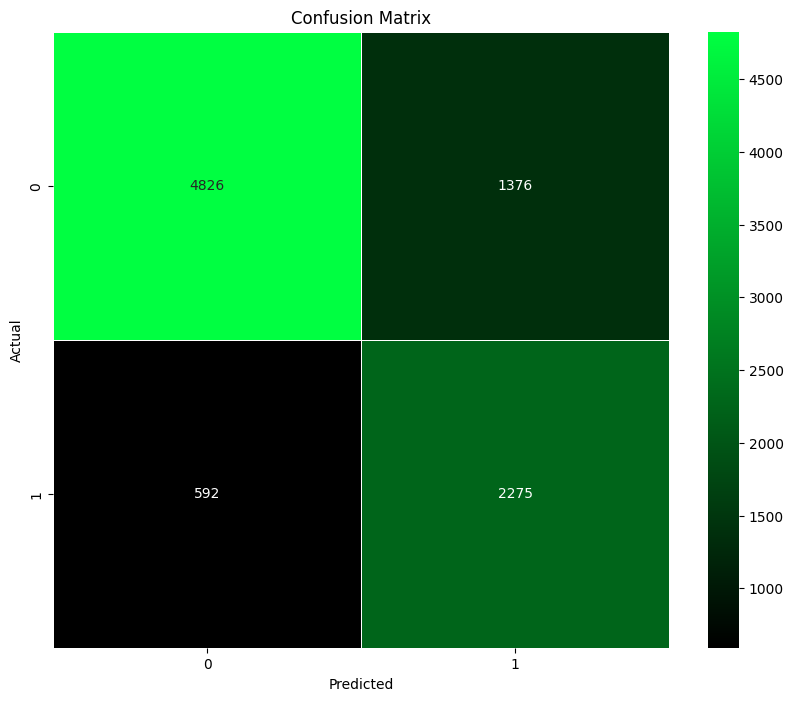

In [65]:
best_threshold_tl = get_threshold(tl_model, val_eval_gen_tl)

tl_val_perf = model_performance_classification(
    tl_model,
    val_eval_gen_tl,
    threshold=best_threshold_tl
)

display(tl_val_perf)
plot_confusion_matrix(tl_model, val_eval_gen_tl, threshold=best_threshold_tl)

## **I.4 Observation**

* DenseNet121 significantly outperformed the CNN
(224×224) model, improving Accuracy from 72.4% to 78.6%, Recall from 76.9% to 78.5%, and PR-AUC from 0.62 to 0.74.

* The improvement demonstrates that transfer learning and pre-trained feature extraction are substantially more effective than training a CNN from scratch for detecting pneumonia patterns in chest X-ray images.

# **J: DenseNet121 - Fine tuning**

## **J.1: Fine-Tuning**

In [29]:
IMG_SIZE = (224, 224)
BATCH_SIZE = 16
EPOCHS = 5

In [30]:
tl_ft_model = tf.keras.models.load_model(
    densenet_checkpoint_path
)

In [31]:
# Unfreeze DenseNet base model
base_model.trainable = True

# Train only last 40 layers
for layer in base_model.layers[:-40]:
    layer.trainable = False

for layer in base_model.layers[-40:]:
    layer.trainable = True

# Compile with very low learning rate
tl_ft_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),
    loss="binary_crossentropy",
    metrics=[
        "accuracy",
        tf.keras.metrics.AUC(name="roc_auc"),
        tf.keras.metrics.AUC(name="pr_auc", curve="PR"),
        tf.keras.metrics.Recall(name="recall"),
        tf.keras.metrics.Precision(name="precision")
    ]
)

densenet_fine_tuned_checkpoint_path = f"{google_path}/best_densenet_finetuned.keras"

# Callbacks
callbacks_ft = [
    tf.keras.callbacks.EarlyStopping(
        monitor="val_pr_auc",
        mode="max",
        patience=3,
        restore_best_weights=True
    ),
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor="val_pr_auc",
        mode="max",
        factor=0.3,
        patience=2,
        min_lr=1e-7
    ),
    tf.keras.callbacks.ModelCheckpoint(
        filepath=densenet_fine_tuned_checkpoint_path,
        monitor="val_pr_auc",
        mode="max",
        save_best_only=True
    )
]

# Fine-tune
history_ft = tl_ft_model.fit(
    train_gen_tl,
    validation_data=val_gen_tl,
    epochs=EPOCHS,
    callbacks=callbacks_ft,
    verbose=2
)

Epoch 1/5
662/662 - 148s - 224ms/step - accuracy: 0.8064 - loss: 0.4189 - pr_auc: 0.7486 - precision: 0.7169 - recall: 0.6406 - roc_auc: 0.8655 - val_accuracy: 0.7987 - val_loss: 0.4238 - val_pr_auc: 0.7396 - val_precision: 0.7095 - val_recall: 0.6149 - val_roc_auc: 0.8620 - learning_rate: 1.0000e-05
Epoch 2/5
662/662 - 75s - 113ms/step - accuracy: 0.8086 - loss: 0.4169 - pr_auc: 0.7516 - precision: 0.7247 - recall: 0.6364 - roc_auc: 0.8669 - val_accuracy: 0.7994 - val_loss: 0.4240 - val_pr_auc: 0.7403 - val_precision: 0.6992 - val_recall: 0.6414 - val_roc_auc: 0.8623 - learning_rate: 1.0000e-05
Epoch 3/5
662/662 - 73s - 110ms/step - accuracy: 0.8076 - loss: 0.4139 - pr_auc: 0.7550 - precision: 0.7219 - recall: 0.6367 - roc_auc: 0.8691 - val_accuracy: 0.7990 - val_loss: 0.4237 - val_pr_auc: 0.7401 - val_precision: 0.6989 - val_recall: 0.6397 - val_roc_auc: 0.8624 - learning_rate: 1.0000e-05
Epoch 4/5
662/662 - 93s - 141ms/step - accuracy: 0.8106 - loss: 0.4124 - pr_auc: 0.7575 - precis

## **J.2: Evaluation**

284/284 ━━━━━━━━━━━━━━━━━━━━ 22s 78ms/step
Best threshold: 0.31257123
Precision: 0.6171458998935038
Recall: 0.8085106382978723
F1: 0.6999848961923071
Best fine-tuned threshold: 0.31257123
284/284 ━━━━━━━━━━━━━━━━━━━━ 23s 82ms/step

Threshold used: 0.31257123

Confusion Matrix:
 [[4764 1438]
 [ 550 2317]]

Classification Report:

              precision    recall  f1-score   support

           0       0.90      0.77      0.83      6202
           1       0.62      0.81      0.70      2867

    accuracy                           0.78      9069
   macro avg       0.76      0.79      0.76      9069
weighted avg       0.81      0.78      0.79      9069



,Accuracy,Recall (Class 1),Precision (Class 1),F1 (Class 1),ROC-AUC,PR-AUC
0,0.780792,0.808162,0.617044,0.699789,0.862862,0.741479


284/284 ━━━━━━━━━━━━━━━━━━━━ 23s 81ms/step


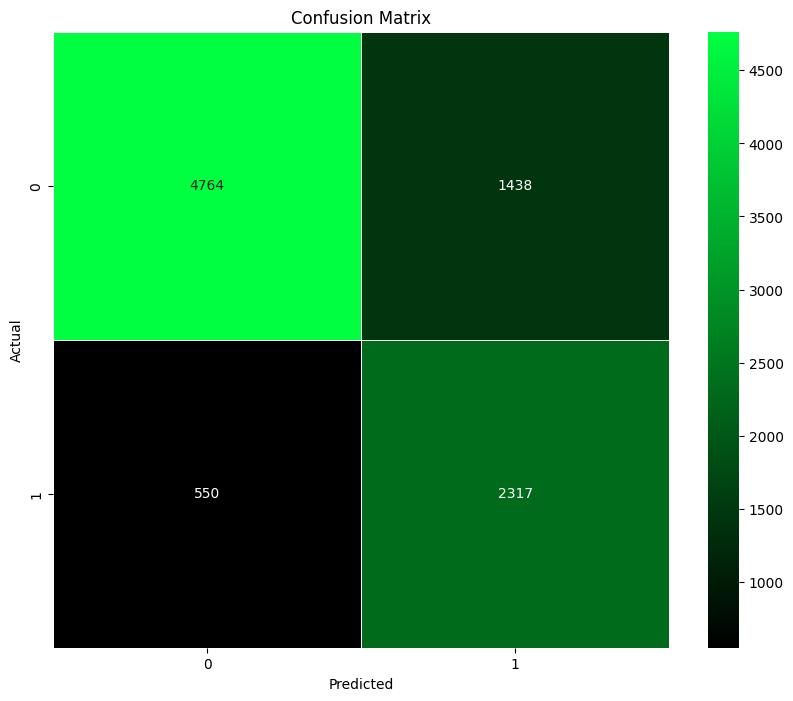

In [34]:
# 1. Get best threshold on validation set
best_threshold_ft = get_threshold(
    tl_ft_model,
    val_eval_gen_tl
)

print("Best fine-tuned threshold:", best_threshold_ft)

# 2. Evaluate fine-tuned model
tl_ft_val_perf = model_performance_classification(
    tl_ft_model,
    val_eval_gen_tl,
    threshold=best_threshold_ft
)

display(tl_ft_val_perf)

# 3. Confusion matrix
plot_confusion_matrix(
    tl_ft_model,
    val_eval_gen_tl,
    threshold=best_threshold_ft
)

In [35]:
for t in [0.30, 0.32, 0.34, 0.36, 0.38, 0.40]:
    print("Threshold:", t)
    display(model_performance_classification(tl_ft_model, val_eval_gen_tl, threshold=t))

Threshold: 0.3
284/284 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step

Threshold used: 0.3

Confusion Matrix:
 [[4708 1494]
 [ 533 2334]]

Classification Report:

              precision    recall  f1-score   support

           0       0.90      0.76      0.82      6202
           1       0.61      0.81      0.70      2867

    accuracy                           0.78      9069
   macro avg       0.75      0.79      0.76      9069
weighted avg       0.81      0.78      0.78      9069



,Accuracy,Recall (Class 1),Precision (Class 1),F1 (Class 1),ROC-AUC,PR-AUC
0,0.776491,0.814091,0.609718,0.697237,0.862862,0.741479


Threshold: 0.32
284/284 ━━━━━━━━━━━━━━━━━━━━ 23s 82ms/step

Threshold used: 0.32

Confusion Matrix:
 [[4794 1408]
 [ 571 2296]]

Classification Report:

              precision    recall  f1-score   support

           0       0.89      0.77      0.83      6202
           1       0.62      0.80      0.70      2867

    accuracy                           0.78      9069
   macro avg       0.76      0.79      0.76      9069
weighted avg       0.81      0.78      0.79      9069



,Accuracy,Recall (Class 1),Precision (Class 1),F1 (Class 1),ROC-AUC,PR-AUC
0,0.781784,0.800837,0.61987,0.698828,0.862862,0.741479


Threshold: 0.34
284/284 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step

Threshold used: 0.34

Confusion Matrix:
 [[4888 1314]
 [ 638 2229]]

Classification Report:

              precision    recall  f1-score   support

           0       0.88      0.79      0.83      6202
           1       0.63      0.78      0.70      2867

    accuracy                           0.78      9069
   macro avg       0.76      0.78      0.76      9069
weighted avg       0.80      0.78      0.79      9069



,Accuracy,Recall (Class 1),Precision (Class 1),F1 (Class 1),ROC-AUC,PR-AUC
0,0.784761,0.777468,0.629128,0.695476,0.862862,0.741479


Threshold: 0.36
284/284 ━━━━━━━━━━━━━━━━━━━━ 22s 78ms/step

Threshold used: 0.36

Confusion Matrix:
 [[4978 1224]
 [ 695 2172]]

Classification Report:

              precision    recall  f1-score   support

           0       0.88      0.80      0.84      6202
           1       0.64      0.76      0.69      2867

    accuracy                           0.79      9069
   macro avg       0.76      0.78      0.77      9069
weighted avg       0.80      0.79      0.79      9069



,Accuracy,Recall (Class 1),Precision (Class 1),F1 (Class 1),ROC-AUC,PR-AUC
0,0.7884,0.757586,0.639576,0.693597,0.862862,0.741479


Threshold: 0.38
284/284 ━━━━━━━━━━━━━━━━━━━━ 23s 80ms/step

Threshold used: 0.38

Confusion Matrix:
 [[5083 1119]
 [ 742 2125]]

Classification Report:

              precision    recall  f1-score   support

           0       0.87      0.82      0.85      6202
           1       0.66      0.74      0.70      2867

    accuracy                           0.79      9069
   macro avg       0.76      0.78      0.77      9069
weighted avg       0.80      0.79      0.80      9069



,Accuracy,Recall (Class 1),Precision (Class 1),F1 (Class 1),ROC-AUC,PR-AUC
0,0.794795,0.741193,0.655055,0.695467,0.862862,0.741479


Threshold: 0.4
284/284 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step

Threshold used: 0.4

Confusion Matrix:
 [[5189 1013]
 [ 796 2071]]

Classification Report:

              precision    recall  f1-score   support

           0       0.87      0.84      0.85      6202
           1       0.67      0.72      0.70      2867

    accuracy                           0.80      9069
   macro avg       0.77      0.78      0.77      9069
weighted avg       0.81      0.80      0.80      9069



,Accuracy,Recall (Class 1),Precision (Class 1),F1 (Class 1),ROC-AUC,PR-AUC
0,0.800529,0.722358,0.67153,0.696017,0.862862,0.741479


## **J.3: Observation**

* Fine-tuning DenseNet121 improved Recall from 78.5% to 80.8% and reduced false negatives, enabling the model to identify more pneumonia cases.
* While Accuracy and Precision remained largely stable, the fine-tuned model is better suited for medical screening scenarios where maximizing case detection is a higher priority than minimizing false positives.

# **K: Final Comparison View**

In [36]:
import pandas as pd

def print_model_result(
    model_name,
    threshold,
    accuracy,
    recall,
    precision,
    f1,
    roc_auc,
    pr_auc
):
    return pd.DataFrame({
        "Model": [model_name],
        "Threshold": [round(threshold, 3)],
        "Accuracy": [round(accuracy, 4)],
        "Recall": [round(recall, 4)],
        "Precision": [round(precision, 4)],
        "F1 Score": [round(f1, 4)],
        "ROC-AUC": [round(roc_auc, 4)],
        "PR-AUC": [round(pr_auc, 4)]
    })

In [37]:
cnn_256_df = print_model_result(
    "CNN (256x256)",
    0.380,
    0.7141,
    0.7496,
    0.5340,
    0.6237,
    0.7788,
    0.5780
)

cnn_224_df = print_model_result(
    "CNN (224x224)",
    0.342,
    0.7236,
    0.7691,
    0.5444,
    0.6376,
    0.7975,
    0.6196
)

densenet_frozen_df = print_model_result(
    "DenseNet121 (Frozen)",
    0.353,
    0.7858,
    0.7851,
    0.6291,
    0.6985,
    0.8627,
    0.7424
)

densenet_ft_best_df = print_model_result(
    "DenseNet121 (Fine-Tuned Best)",
    0.313,
    0.7808,
    0.8082,
    0.6170,
    0.6998,
    0.8629,
    0.7415
)

densenet_ft_032_df = print_model_result(
    "DenseNet121 (FT @ 0.32)",
    0.320,
    0.7818,
    0.8008,
    0.6199,
    0.6988,
    0.8629,
    0.7415
)

densenet_ft_038_df = print_model_result(
    "DenseNet121 (FT @ 0.38)",
    0.380,
    0.7948,
    0.7412,
    0.6551,
    0.6955,
    0.8629,
    0.7415
)

In [38]:
comparison_df = pd.concat([
    cnn_256_df,
    cnn_224_df,
    densenet_frozen_df,
    densenet_ft_best_df,
    densenet_ft_032_df,
    densenet_ft_038_df
], ignore_index=True)

display(comparison_df)

,Model,Threshold,Accuracy,Recall,Precision,F1 Score,ROC-AUC,PR-AUC
0,CNN (256x256),0.380,0.7141,0.7496,0.5340,0.6237,0.7788,0.5780
1,CNN (224x224),0.342,0.7236,0.7691,0.5444,0.6376,0.7975,0.6196
2,DenseNet121 (Frozen),0.353,0.7858,0.7851,0.6291,0.6985,0.8627,0.7424
3,DenseNet121 (Fine-Tuned Best),0.313,0.7808,0.8082,0.6170,0.6998,0.8629,0.7415
4,DenseNet121 (FT @ 0.32),0.320,0.7818,0.8008,0.6199,0.6988,0.8629,0.7415
5,DenseNet121 (FT @ 0.38),0.380,0.7948,0.7412,0.6551,0.6955,0.8629,0.7415


# **L: Key Insights:**

**L.1: Key Insights from Model Comparison**

* Reducing image size from 256×256 to 224×224 improved model performance while reducing computational cost.
* Transfer learning using DenseNet121 significantly outperformed CNN models trained from scratch across all evaluation metrics.
* DenseNet121 achieved approximately 8–10% improvement in accuracy and 20% improvement in PR-AUC compared to the baseline CNN.
* Fine-tuning the DenseNet model increased Recall from ~78.5% to ~80.8%, reducing the number of missed pneumonia cases.
* Threshold optimization had a significant impact on model performance, highlighting the importance of selecting thresholds based on business objectives.
* Higher thresholds improved precision and accuracy, while lower thresholds improved recall.
* Performance gains were primarily driven by model architecture and transfer learning, rather than increasing image resolution.

**L.2: Recommended Model**

For Medical Screening Use Cases

DenseNet121 Fine-Tuned with Best Threshold (0.31) is the recommended model.

Achieved:
* Accuracy: 78.1%
* Recall: 80.8% (Highest)
* Precision: 61.7%
* F1 Score: 0.70
* ROC-AUC: 0.863
* PR-AUC: 0.741

This model minimizes False Negatives, ensuring that the maximum number of pneumonia cases are identified.
In healthcare screening scenarios, missing a pneumonia case is generally more critical than generating additional false positives, making this model the most suitable choice.

**L.3: For Balanced Production Deployment**


DenseNet121 Frozen can be considered due to its slightly higher precision and overall balance between recall and precision.

**L.4: Final Takeaway**

* Transfer learning proved to be the most impactful improvement in the project.

* **The** Fine-Tuned DenseNet121 with the optimized threshold provides the best screening-oriented performance and is the preferred model when patient safety and early pneumonia detection are the primary objectives.

# **M: APP Setup for Hospital staffs**

## **M.1: Setup of upload files**


pneumonia-streamlit-app/

├── app.py\
├── requirements.txt\
├── README.md\
├── best_densenet_finetuned.keras\
└── densenet_threshold.json

In [32]:
#Create folder

import os

PROJECT_DIR = "/content/pneumonia-streamlit-app"
os.makedirs(PROJECT_DIR, exist_ok=True)



In [46]:
densenet_fine_tuned_checkpoint_path = f"{google_path}/best_densenet_finetuned.keras"

tl_ft_model = tf.keras.models.load_model(
    densenet_fine_tuned_checkpoint_path
)

weights_path = f"{google_path}/densenet_weights.weights.h5"
tl_ft_model.save_weights(weights_path)
print("Weights saved:", weights_path)

Weights saved: /content/drive/My Drive/Colab Notebooks/capstone_project/pnemonia/densenet_weights.weights.h5


In [47]:
#Copy the best model

import shutil

shutil.copy(
    weights_path,
    f"{PROJECT_DIR}/densenet_weights.weights.h5"
)

print("Weights copied")

Weights copied


In [48]:
#Best model threshold config

import json

threshold_data = {
    "threshold": 0.31257123
}

with open(f"{PROJECT_DIR}/densenet_threshold.json", "w") as f:
    json.dump(threshold_data, f)

print("Threshold file created")

Threshold file created


In [71]:
requirements = """
gradio
tensorflow
numpy
opencv-python-headless
pillow
pydicom
"""

with open(f"{PROJECT_DIR}/requirements.txt", "w") as f:
    f.write(requirements.strip())

print("requirements.txt updated")

requirements.txt updated


In [66]:
readme = """
---
title: Pneumonia Detection
emoji: 🩻
colorFrom: blue
colorTo: green
sdk: gradio
app_file: app.py
pinned: false
---

# Pneumonia Detection

This app uses a fine-tuned DenseNet121 model to detect pneumonia / lung opacity from chest X-ray images.
"""

with open(f"{PROJECT_DIR}/README.md", "w") as f:
    f.write(readme.strip())

print("README.md updated")

README.md updated


In [76]:
app_code = r'''
import gradio as gr
import tensorflow as tf
import numpy as np
import cv2
import json
import pydicom
from PIL import Image

from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.models import Model

IMG_SIZE = (224, 224)

def build_model():
    base_model = DenseNet121(
        weights=None,
        include_top=False,
        input_shape=(224, 224, 3)
    )

    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(128, activation="relu")(x)
    x = Dropout(0.4)(x)
    output = Dense(1, activation="sigmoid")(x)

    model = Model(inputs=base_model.input, outputs=output)
    return model

model = build_model()
model.load_weights("densenet_weights.weights.h5")

with open("densenet_threshold.json") as f:
    threshold = json.load(f)["threshold"]

def preprocess_file(file):
    file_path = file.name
    lower_path = file_path.lower()

    if lower_path.endswith(".dcm"):
        ds = pydicom.dcmread(file_path)
        img = ds.pixel_array.astype(np.float32)
    else:
        img = np.array(Image.open(file_path).convert("L")).astype(np.float32)

    img = cv2.resize(img, IMG_SIZE)
    img = cv2.normalize(img, None, 0, 1, cv2.NORM_MINMAX)

    preview_img = (img * 255).astype(np.uint8)

    img_3ch = np.stack([img, img, img], axis=-1)
    img_3ch = np.expand_dims(img_3ch, axis=0)

    return preview_img, img_3ch

def predict_pneumonia(file):
    if file is None:
        return None, "Please upload an X-ray image.", None

    preview_img, model_img = preprocess_file(file)

    prob = float(model.predict(model_img, verbose=0)[0][0])
    pred = int(prob > threshold)

    if pred == 1:
        label = "Pneumonia / Lung Opacity Detected"
    else:
        label = "No Pneumonia / Lung Opacity Detected"

    result = {
        label: prob,
        "Threshold": threshold
    }

    return preview_img, label, result

demo = gr.Interface(
    fn=predict_pneumonia,
    inputs=gr.File(
        label="Upload Chest X-ray",
        file_types=[".png", ".jpg", ".jpeg", ".dcm"]
    ),
    outputs=[
        gr.Image(label="X-ray Preview"),
        gr.Textbox(label="Prediction"),
        gr.Label(label="Probability")
    ],
    title="🩻 Pneumonia Detection",
    description="Upload a chest X-ray image or DICOM file to detect pneumonia / lung opacity. This is an AI screening demo only."
)

demo.launch(server_name="0.0.0.0", server_port=7860)
'''

with open(f"{PROJECT_DIR}/app.py", "w") as f:
    f.write(app_code)

print("Final app.py created")

Final app.py created


In [61]:
# dockerfile = """
# FROM python:3.10

# WORKDIR /app

# COPY requirements.txt .
# RUN pip install --no-cache-dir -r requirements.txt

# COPY . .

# EXPOSE 7860

# CMD ["streamlit", "run", "app.py", "--server.port=7860", "--server.address=0.0.0.0", "--server.maxUploadSize=500"]
# """

# with open(f"{PROJECT_DIR}/Dockerfile", "w") as f:
#     f.write(dockerfile.strip())

# print("docker file created")

docker file created


## **M.2: Hugging Face Setup and upload**

In [68]:
import os
from huggingface_hub import HfApi
from huggingface_hub import HfApi, create_repo

from google.colab import userdata

hf_token = userdata.get('HF_TOKEN')

In [73]:
api = HfApi(token=hf_token)

HF_USERNAME = "Rajse"
SPACE_NAME = "pneumonia-detection"

repo_id = f"{HF_USERNAME}/{SPACE_NAME}"

api.create_repo(
    repo_id=repo_id,
    repo_type="space",
    space_sdk="gradio",
    exist_ok=True
)

RepoUrl('https://huggingface.co/spaces/Rajse/pneumonia-detection', endpoint='https://huggingface.co', repo_type='space', repo_id='Rajse/pneumonia-detection')

In [77]:
from huggingface_hub import upload_folder

upload_folder(
    repo_id=repo_id,
    repo_type="space",
    folder_path=PROJECT_DIR,
    token=hf_token
)

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  ..._densenet_finetuned.keras: 100%|##########| 31.2MB / 31.2MB            

  ...nsenet_weights.weights.h5:  95%|#########5| 29.4MB / 30.8MB            

CommitInfo(commit_url='https://huggingface.co/spaces/Rajse/pneumonia-detection/commit/84697958e385401392a6c3f882e94308fe853d35', commit_message='Upload folder using huggingface_hub', commit_description='', oid='84697958e385401392a6c3f882e94308fe853d35', pr_url=None, repo_url=RepoUrl('https://huggingface.co/spaces/Rajse/pneumonia-detection', endpoint='https://huggingface.co', repo_type='space', repo_id='Rajse/pneumonia-detection'), pr_revision=None, pr_num=None)

## **M.3: Output**

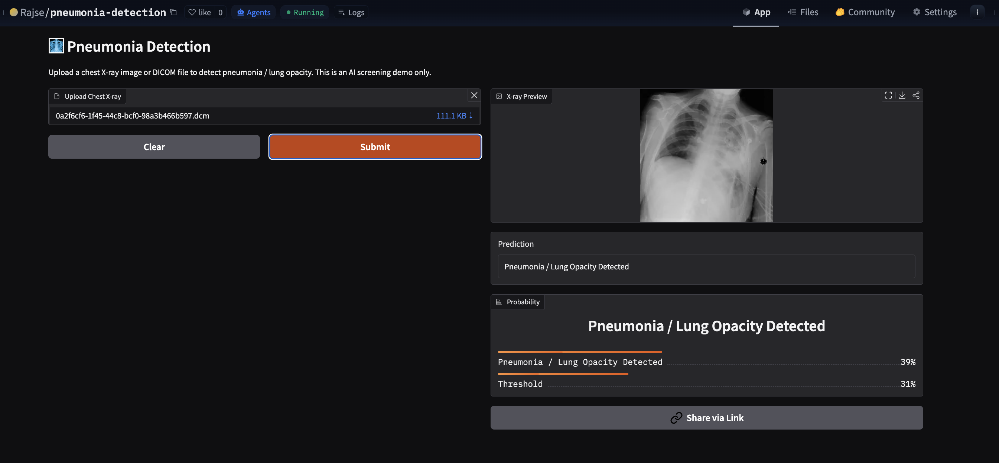

# **N: Final Business Recommendation**

1. **Deploy the Fine-Tuned DenseNet121 Model for Screening**

The Fine-Tuned DenseNet121 model achieved the highest recall (~81%), making it the most suitable choice for pneumonia screening applications.
Higher recall ensures that the maximum number of pneumonia cases are identified, reducing the risk of missed diagnoses.

2. **Use AI as a Clinical Decision Support Tool**

The model should be positioned as a screening and prioritization system rather than a standalone diagnostic tool.
High-risk cases can be automatically flagged and prioritized for radiologist review, improving response time and clinical efficiency.

3. **Optimize Threshold Based on Business Objectives**

For screening use cases, use a lower threshold (~0.31) to maximize pneumonia detection.
For diagnostic support environments, a slightly higher threshold can be used to reduce false positives while maintaining strong detection performance.

4. **Continuously Improve Model Performance Through Retraining**

Periodically retrain the model using newly collected X-ray data from different hospitals, devices, and patient populations.
This will improve generalization, reduce model drift, and maintain performance over time.

5. **Enhance the Solution with Advanced Medical AI Techniques**

Future improvements such as Grad-CAM visual explanations, ensemble models, and advanced architectures can further improve model reliability and clinician trust.
Explainable AI can help radiologists understand which lung regions influenced the prediction, increasing adoption and transparency.

**Final Recommendation**

Deploy the Fine-Tuned DenseNet121 model with an optimized threshold of ~0.31 as a pneumonia screening solution. The model provides the best balance between performance and patient safety by maximizing recall and minimizing missed pneumonia cases.